<div class="alert alert-block alert-danger">

# **Adversarial Attacks on AI Detection Systems (TTI)**

---

#### Soh En Ming, 32024975
#### Environment: **Python 3.11**
</div>

<div class="alert alert-block alert-info">
    
## **Table of Contents**

</div>

[1. Initial Setup for Project](#1) <br>
[2. Running Instruct-Pix2Pix](#2) <br>
[3. Bypassing AI-based Image Detection systems](#3) <br>
[4. Testing Pix2Pix prompt outputs against adversarial noised outputs](#4) <br>
[5. Targetting Light.TTI's AI image detection approaches (Bonus)](#5) <br>
[6. Overall analysis on Results](#6) <br>
[7. References](#7) <br>


<div class="alert alert-block alert-success">
    
## **1. Initial Setup for Project**  <a class="anchor" name="1"></a>

### Cloning InstructPix2Pix Git repository and required files to our local directory

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
%cd /content/drive/MyDrive/MAI/FIT5230_Asgn_2

/content/drive/.shortcut-targets-by-id/1QSTF7evPaMXMttMRhdNvVH-aY1FiK1dF/FIT5230 Asgn 2


In [ ]:
# Clone the InstructPix2Pix repository
!git clone https://github.com/timothybrooks/instruct-pix2pix.git
%cd instruct-pix2pix


Cloning into 'instruct-pix2pix'...
remote: Enumerating objects: 427, done.
remote: Counting objects: 100% (119/119), done.
remote: Compressing objects: 100% (36/36), done.
remote: Total 427 (delta 91), reused 83 (delta 83), pack-reused 308 (from 1)
Receiving objects: 100% (427/427), 17.29 MiB | 21.44 MiB/s, done.
Resolving deltas: 100% (175/175), done.
Updating files: 100% (160/160), done.
/content/drive/.shortcut-targets-by-id/1QSTF7evPaMXMttMRhdNvVH-aY1FiK1dF/FIT5230 Asgn 2/instruct-pix2pix


In [ ]:
# Install conda
!wget -c https://repo.anaconda.com/miniconda/Miniconda3-latest-Linux-x86_64.sh
!chmod +x Miniconda3-latest-Linux-x86_64.sh
!bash ./Miniconda3-latest-Linux-x86_64.sh -b -f -p /usr/local

--2024-10-11 09:46:35--  https://repo.anaconda.com/miniconda/Miniconda3-latest-Linux-x86_64.sh
Resolving repo.anaconda.com (repo.anaconda.com)... 104.16.32.241, 104.16.191.158, 2606:4700::6810:20f1, ...
Connecting to repo.anaconda.com (repo.anaconda.com)|104.16.32.241|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

PREFIX=/usr/local
Unpacking payload ...

Installing base environment...

Preparing transaction: ...working... done
Executing transaction: ...working... done
installation finished.
    You currently have a PYTHONPATH environment variable set. This may cause
    unexpected behavior when running the Python interpreter in Miniconda3.
    For best results, please verify that your PYTHONPATH only points to
    directories of packages that are compatible with the Python interpreter
    in Miniconda3: /usr/local


In [ ]:
# Update PATH variable so conda can be used
import os
os.environ["PATH"] += ":/usr/local/bin"

In [ ]:
# Verify installation
!conda --version

conda 24.7.1


In [ ]:
# Create the environment from the environment.yaml file
!conda env create -f environment.yaml

# Activate the environment
!source activate ip2p


Channels:
 - pytorch
 - defaults
Platform: linux-64
Solving environment: - \ done

pytorch-1.11.0       | 1.02 GB   | :   0% 0/1 [00:00<?, ?it/s]
cudatoolkit-11.3.1   | 549.3 MB  | :   0% 0/1 [00:00<?, ?it/s]

mkl-2021.4.0         | 142.6 MB  | :   0% 0/1 [00:00<?, ?it/s]


python-3.8.5         | 49.3 MB   | :   0% 0/1 [00:00<?, ?it/s]



torchvision-0.12.0   | 27.7 MB   | :   0% 0/1 [00:00<?, ?it/s]




numpy-base-1.19.2    | 10.1 MB   | :   0% 0/1 [00:00<?, ?it/s]





ffmpeg-4.3           | 9.9 MB    | :   0% 0/1 [00:00<?, ?it/s]






intel-openmp-2021.4. | 4.2 MB    | :   0% 0/1 [00:00<?, ?it/s]







openssl-1.1.1w       | 3.7 MB    | :   0% 0/1 [00:00<?, ?it/s]








libgfortran5-11.2.0  | 2.0 MB    | :   0% 0/1 [00:00<?, ?it/s]









pip-20.3.3           | 1.8 MB    | :   0% 0/1 [00:00<?, ?it/s]










setuptools-75.1.0    | 1.7 MB    | :   0% 0/1 [00:00<?, ?it/s]











gnutls-3.6.15        | 1.0 MB    | :   0% 0/1 [00:00<?, ?it/s]












libuv-1.48.0    

In [ ]:
# Unmount Google Drive
!drive unmount

/bin/bash: line 1: drive: command not found


In [ ]:
# Display the content of the script to inspect the URLs
!cat scripts/download_checkpoints.sh


#!/bin/bash

SCRIPT_DIR=$( cd -- "$( dirname -- "${BASH_SOURCE[0]}" )" &> /dev/null && pwd )

mkdir -p $SCRIPT_DIR/../checkpoints

curl http://instruct-pix2pix.eecs.berkeley.edu/instruct-pix2pix-00-22000.ckpt -o $SCRIPT_DIR/../checkpoints/instruct-pix2pix-00-22000.ckpt


In [ ]:
!wget -O instruct-pix2pix-00-22000.ckpt http://instruct-pix2pix.eecs.berkeley.edu/instruct-pix2pix-00-22000.ckpt

--2024-09-20 07:39:02--  http://instruct-pix2pix.eecs.berkeley.edu/instruct-pix2pix-00-22000.ckpt
Resolving instruct-pix2pix.eecs.berkeley.edu (instruct-pix2pix.eecs.berkeley.edu)... 128.32.244.190
Connecting to instruct-pix2pix.eecs.berkeley.edu (instruct-pix2pix.eecs.berkeley.edu)|128.32.244.190|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 7703927910 (7.2G)
Saving to: ‘instruct-pix2pix-00-22000.ckpt’

instruct-pix2pix-00 100%[===================>]   7.17G  34.0MB/s    in 10m 46s 

2024-09-20 07:49:48 (11.4 MB/s) - ‘instruct-pix2pix-00-22000.ckpt’ saved [7703927910/7703927910]



### Installation of Dependencies and Libraries

In [ ]:
!pip install einops
!pip install k_diffusion
!pip install omegaconf
!pip install pytorch-lightning==1.5.0

In [ ]:
%cd taming-transformers
!pip install -e .

/content/drive/.shortcut-targets-by-id/1QSTF7evPaMXMttMRhdNvVH-aY1FiK1dF/FIT5230_Asgn_2/instruct-pix2pix/taming-transformers
Obtaining file:///content/drive/.shortcut-targets-by-id/1QSTF7evPaMXMttMRhdNvVH-aY1FiK1dF/FIT5230_Asgn_2/instruct-pix2pix/taming-transformers


In [ ]:
import taming
print("Taming Transformers installed successfully.")
%cd "C:\\Users\\soh88\\content\\drive\\MyDrive\\FIT5230_Asgn_2\\instruct-pix2pix"

In [ ]:
import torch
from torchvision import models, transforms
import matplotlib.pyplot as plt
import clip

InstructPix2Pix was taken from the research paper https://arxiv.org/abs/2211.
<br>Codes were cloned from their Git Repository https://github.com/timothybrooks/instruct-pix2pix
<br>

**Note:** Due to limited computational power from both Google Collab and some of our local devices, we had to resort to using the local runtime to run the following codes after the initial setup due to high VRAM requirments.

## **2. Prompts for InstructPix2Pix**

Initial test prompt to verify that the code can be ran locally from Google Collab. For this test we've chosen a dog image which can be seen below.

In [ ]:
%cd "C:\\Users\\soh88\\content\\drive\\MyDrive\\FIT5230_Asgn_2\\instruct-pix2pix"

C:\Users\soh88\content\drive\MyDrive\FIT5230_Asgn_2\instruct-pix2pix


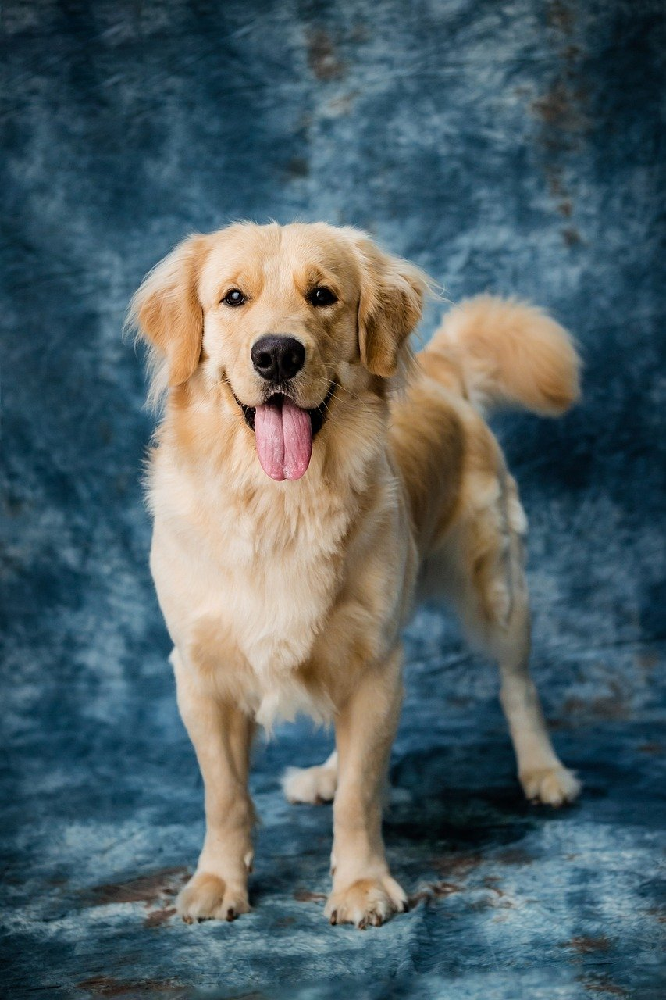

In [ ]:
from IPython.display import Image, display
output_image_path = "dog.jpg"
display(Image(output_image_path, width=400))

In [ ]:
!python edit_cli.py --input dog.jpg --output dog_output.jpg --edit "put a hat on the dog" --ckpt "C:\\Users\\soh88\\content\\drive\\MyDrive\\FIT5230_Asgn_2\\instruct-pix2pix\\checkpoints\\instruct-pix2pix-00-22000.ckpt" --steps 100

Loading model from C:\\Users\\soh88\\content\\drive\\MyDrive\\FIT5230_Asgn_2\\instruct-pix2pix\\checkpoints\\instruct-pix2pix-00-22000.ckpt
Global Step: 22000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.53 M params.
Keeping EMAs of 688.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


C:\Users\soh88\content\drive\MyDrive\FIT5230_Asgn_2\instruct-pix2pix\edit_cli.py:41: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  pl_sd = torch.load(ckpt, map_location="cpu

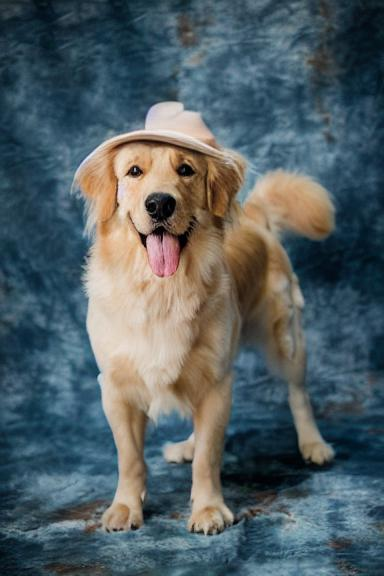

In [ ]:
output_image_path = "dog_output.jpg"
display(Image(output_image_path))

As seen above, the prompt is sucessful and displays the dog wearing a hat. Moving on, to ensure realiability of the InstructPix2Pix we've also tried another prompt but instead of a dog it will be a human being which in this case is the late celebrity Leonardo Di Caprio which can be seen below.

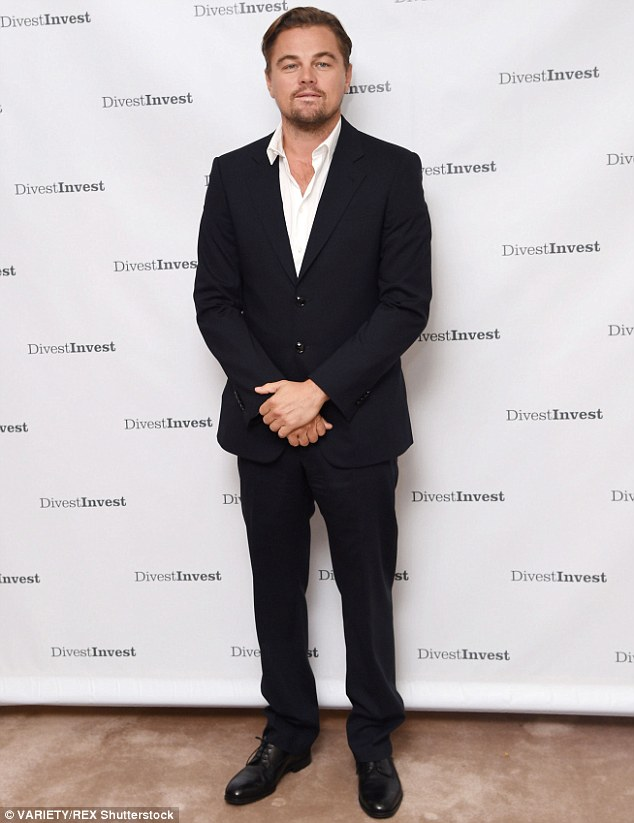

In [ ]:
output_image_path = "ldc_pic.jpeg"
display(Image(output_image_path, width=400))

In [ ]:
!python edit_cli.py --input ldc_pic.jpeg --output ldc_output.jpg --edit "put a hat on the person" --ckpt "C:\\Users\\soh88\\content\\drive\\MyDrive\\FIT5230_Asgn_2\\instruct-pix2pix\\checkpoints\\instruct-pix2pix-00-22000.ckpt" --steps 100

Loading model from C:\\Users\\soh88\\content\\drive\\MyDrive\\FIT5230_Asgn_2\\instruct-pix2pix\\checkpoints\\instruct-pix2pix-00-22000.ckpt
Global Step: 22000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.53 M params.
Keeping EMAs of 688.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


C:\Users\soh88\content\drive\MyDrive\FIT5230_Asgn_2\instruct-pix2pix\edit_cli.py:41: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  pl_sd = torch.load(ckpt, map_location="cpu

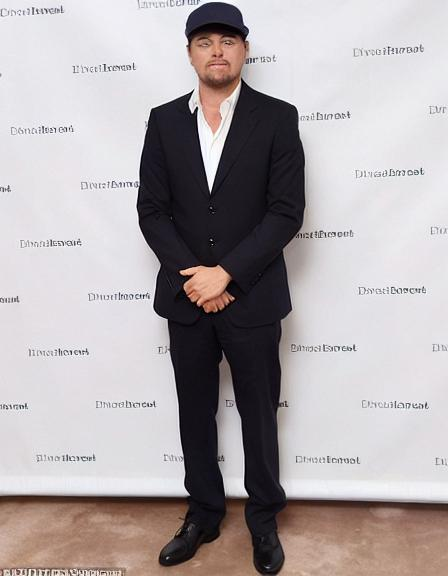

In [ ]:
output_image_path = "ldc_output.jpg"
display(Image(output_image_path))

Similar to the Dog input image, the prompt image featuring Leo has been successful with a hat appearing above his head though at the cost of some disparaties from the orginal input image (face distorted, words in image not beiong legible).

<div class="alert alert-block alert-success">
    
## **3. Bypassing AI-based Image Detection systems**  <a class="anchor" name="3"></a>

What we aim?
- To make the AI-manupilated / generated images harder to be guarded down by detection systems / classifiers.

How did we do it?
- Implemented a mixed attack mechanism, we meant to apply the adversarial attacks on the images after it has been generate by any model ( In our case, InstructPix2Pix ).
- We uses these attacks to "fool" detections/classifiers, to cause them mis-classfiy the attacked images.
- These attacks should not alter the images drastically in perceptal similarity.




In [ ]:
import taming
import torch
from torchvision import models, transforms
from PIL import Image
import matplotlib.pyplot as plt
import clip
import numpy as np
from skimage.metrics import structural_similarity as ssim

In [ ]:
%cd "C:\\Users\\soh88\\content\\drive\\MyDrive\\FIT5230_Asgn_2\\instruct-pix2pix"

C:\Users\soh88\content\drive\MyDrive\FIT5230_Asgn_2\instruct-pix2pix


### Attack Mechanism

**Introduction**

We developed a Mixed Attack strategy that combines DeepFool, PGD, random noise, and blended backdoor attacks. The goal of this mixed approach is to fool AI systems like CLIP, making them misclassify images, while ensuring that the perturbations remain imperceptible to human eyes.

**Structure**

*   `Mixed Attacks`
 *   `DeepFool Attack`: It generates minimal perturbations needed to cross the decision boundary, leading to misclassification. It iteratively adjusts the image until the classifier changes its prediction. While effective, DeepFool might not evade more robust classifiers like CLIP, which can withstand minimal gradient-based attacks .
 *   `PGD Attack (Projected Gradient Descent)`: PGD takes multiple small steps towards maximizing the classification error. Unlike DeepFool, PGD projects the adversarial image back within a constrained region (epsilon-ball), ensuring that perturbations remain within limits . PGD is particularly effective against classifiers but can cause noticeable artifacts when used alone .
 *   `Random Noise Attack`: Adds subtle perturbations without targeting specific features, making it harder for detection models to identify common adversarial patterns . On its own, random noise might not be sufficient, but combined with other attacks, it enhances the overall robustness of the adversarial sample.
*   `Blended Backdoor Attack`: Subtly embeds a trigger pattern into the image. The trigger, often imperceptible to the human eye, manipulates the classifier's prediction by exploiting its learned associations . The blending ratio controls how strongly the trigger influences the model while ensuring the image looks natural to human observers .



**Why Order Attacks This Way?**

`Why DeepFool First?`:

The DeepFool attack was selected to initiate the process because it is an iterative method that effectively moves the input image toward the decision boundary of the classifier, making it easier to fool. This attack ensures that the image is close enough to the boundary to increase the effectiveness of subsequent attacks, making it a solid foundation for further perturbations.


`Why PGD Next?`:

Once DeepFool has created an image close to the decision boundary, the PGD attack is applied to further refine and strengthen the adversarial image. PGD is highly effective because it iteratively optimizes the image to maximize the chance of misclassification, while still maintaining the appearance of the original image. This is especially useful when targeting CLIP model, which is more resistant to single-shot attacks. By applying PGD after DeepFool, I was able to enhance the attack's strength, ensuring that it could fool more robust classifiers like CLIP while keeping the image relatively unchanged from a human perspective.
Random Noise:

`Why Random Noise Last?`:

After applying both DeepFool and PGD,  this step was crucial in further diversifying the attack patterns, making it more difficult for AI detection systems to recognize the adversarial image as tampered. Random noise adds unpredictability, which is essential for targeting models with different architectures, and helps avoid overfitting to a specific classifier’s weaknesses.

`Additional Blended Backdoor Attack?`:

In addition to the mixed attack method we apply `blended backdoor attack`, where a subtle perturbation is applied to the corner of the image, making it difficult for humans to detect but still effective against AI classifiers. It was designed to exploit a specific weakness in detection systems that focus on the central features of an image.

In [ ]:
# Use GPU if possible
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load a pre-trained model for the semantic attack (e.g., ResNet18)
resnet18_model = models.resnet18(pretrained=True).eval().to(device)

C:\Users\soh88\AppData\Local\Programs\Python\Python39\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\soh88\AppData\Local\Programs\Python\Python39\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [ ]:
# Function for DeepFool attack
def deepfool(image, model, num_classes=10, overshoot=0.02, max_iter=50):
    """
    Performs the DeepFool attack on an image.

    Args:
        image (torch.Tensor): The input image.
        model (torch.nn.Module): The classifier to attack.
        num_classes (int): Number of classes to consider for the attack.
        overshoot (float): Used to avoid numerical problems, should be small (default is 0.02).
        max_iter (int): Maximum number of iterations (default is 50).

    Returns:
        perturbed_image (torch.Tensor): The adversarial image.
        r_tot (torch.Tensor): The total perturbation applied.
    """
    image = image.clone().detach().requires_grad_(True).to(device)
    f_image = model(image).data.cpu().numpy().flatten()
    I = np.argsort(f_image)[::-1][:num_classes]  # Get top `num_classes` indices
    label = I[0]

    input_shape = image.shape
    r_tot = torch.zeros(input_shape).to(device)
    perturbed_image = image.clone()

    for _ in range(max_iter):
        output = model(image)
        model.zero_grad()
        output[0, I[0]].backward(retain_graph=True)
        grad_orig = image.grad.data.clone()

        gradients = []
        for k in range(1, num_classes):
            image.grad.zero_()
            output[0, I[k]].backward(retain_graph=True)
            gradients.append(image.grad.data.clone())

        min_perturbation = np.inf
        for k in range(1, num_classes):
            w_k = gradients[k - 1] - grad_orig
            f_k = (output[0, I[k]] - output[0, I[0]]).data
            perturbation = abs(f_k) / torch.norm(w_k.view(-1))

            if perturbation < min_perturbation:
                min_perturbation = perturbation
                w = w_k

        r_i = (min_perturbation + 1e-4) * w / torch.norm(w)
        r_tot = r_tot + r_i
        perturbed_image = image + (1 + overshoot) * r_tot
        image = perturbed_image.clone().detach().requires_grad_(True)

        if torch.argmax(model(image).data, 1)[0] != label:
            break

    return perturbed_image, r_tot

In [ ]:
# PGD (Projected Gradient Descent) Attack Function
def pgd_attack(image, model, label, epsilon, alpha, num_iter):
    """
    Performs the PGD attack on an image.

    Args:
        image (torch.Tensor): The input image.
        model (torch.nn.Module): The classifier to attack.
        label (torch.Tensor): The true label of the input image.
        epsilon (float): Maximum allowed perturbation.
        alpha (float): Step size for each iteration.
        num_iter (int): Number of iterations.

    Returns:
        perturbed_image (torch.Tensor): The adversarial image.
    """
    perturbed_image = image.clone().detach().requires_grad_(True).to(device)

    for _ in range(num_iter):
        output = model(perturbed_image)
        loss = torch.nn.functional.cross_entropy(output, label)
        model.zero_grad()  # Reset model gradients
        loss.backward()

        # Ensure the gradient is retained for the tensor
        if perturbed_image.grad is None:
            print("Gradient not found for perturbed_image, ensure requires_grad is True.")
            return image  # Return the original image if the gradient is not found

        # Update the perturbation using the sign of the gradient (FGSM step)
        with torch.no_grad():
            perturbation = alpha * perturbed_image.grad.sign()
            perturbed_image = perturbed_image + perturbation

            # Project the perturbation to be within the epsilon-ball
            perturbation = torch.clamp(perturbed_image - image, min=-epsilon, max=epsilon)
            perturbed_image = torch.clamp(image + perturbation, min=0, max=1)

        # Re-enable gradient for the next iteration
        perturbed_image.requires_grad_()

    return perturbed_image

In [ ]:
# Modified mixed attack with DeepFool, PGD, and noise
def mixed_attack(image_path, epsilon_noise=0.01, epsilon_pgd=0.03, alpha=0.005, num_iter=50, save_path="adversarial_image_mixed.jpg"):
    """
    Function to apply random noise, PGD, DeepFool attacks, and TV denoising to an image while preserving original size.

    Args:
        image_path (str): Path to the input image.
        epsilon_noise (float): Magnitude of the random noise perturbation.
        epsilon_pgd (float): Maximum perturbation for PGD attack.
        alpha (float): Step size for PGD attack.
        num_iter (int): Number of iterations for PGD attack.
        save_path (str): Path to save the adversarial image.
    """

    # Load the original image with its original size
    original_image = Image.open(image_path).convert('RGB')

    # Preprocess the image (convert to tensor without resizing or cropping)
    preprocess = transforms.ToTensor()
    image_tensor = preprocess(original_image).unsqueeze(0).to(device)  # Add batch dimension
    image_tensor.requires_grad = True  # Enable gradient computation

    # ===== Step 1: Apply DeepFool Attack =====
    adversarial_image_tensor, _ = deepfool(image_tensor, resnet18_model)

    # Detach after DeepFool to prevent breaking the computation graph, but re-enable requires_grad for PGD
    adversarial_image_tensor = adversarial_image_tensor.detach().requires_grad_(True)

    # ===== Step 2: Apply PGD Attack =====
    output = resnet18_model(adversarial_image_tensor)
    label = output.argmax(dim=1)
    adversarial_image_tensor = pgd_attack(adversarial_image_tensor, resnet18_model, label, epsilon_pgd, alpha, num_iter)

    # ===== Step 3: Add Random Noise to the perturbed image =====
    noise = epsilon_noise * torch.randn_like(adversarial_image_tensor)
    adversarial_image_tensor = adversarial_image_tensor + noise
    adversarial_image_tensor = torch.clamp(adversarial_image_tensor, 0, 1)

    # Convert the adversarial image tensor back to a PIL image
    adversarial_image = transforms.ToPILImage()(adversarial_image_tensor.squeeze(0).cpu())

    # Save the adversarial image
    adversarial_image.save(save_path)
    print(f"Adversarial image saved at {save_path}")

    # Display the original and adversarial images for comparison
    fig, ax = plt.subplots(1, 2, figsize=(12, 6))
    ax[0].imshow(original_image)
    ax[0].set_title("Original Image (Unchanged Size)")
    ax[0].axis('off')

    ax[1].imshow(adversarial_image)
    ax[1].set_title(f"Adversarial Image (Mixed Attack with PGD)")
    ax[1].axis('off')

    plt.show()

In [ ]:
# Define the standalone blended backdoor attack function
def blended_backdoor_attack(image_path, trigger_pattern, blend_ratio=0.1, save_path="adversarial_image_backdoor.jpg"):
    """
    Function to apply a blended backdoor attack by embedding a subtle trigger pattern into an image.

    Args:
        image_path (str): Path to the input image.
        trigger_pattern (torch.Tensor): Trigger pattern to blend into the image.
        blend_ratio (float): Blending ratio (default is 0.1).
        save_path (str): Path to save the adversarial image.

    Returns:
        torch.Tensor: Adversarial image tensor with the backdoor trigger applied.
    """
    # Load the original image
    original_image = Image.open(image_path).convert('RGB')

    # Preprocess the image (convert to tensor without resizing or cropping)
    preprocess = transforms.ToTensor()
    image_tensor = preprocess(original_image).unsqueeze(0).to(device)  # Add batch dimension and move to device

    # Ensure the trigger pattern has the same device as the image
    trigger_pattern = trigger_pattern.to(device)

    # Ensure the pattern has the same dimensions as the image
    if trigger_pattern.size() != image_tensor.size():
        trigger_pattern = torch.nn.functional.interpolate(trigger_pattern, size=image_tensor.size()[-2:])

    # Blend the trigger pattern with the original image
    adversarial_image_tensor = (1 - blend_ratio) * image_tensor + blend_ratio * trigger_pattern
    adversarial_image_tensor = torch.clamp(adversarial_image_tensor, 0, 1)  # Clip values between 0 and 1

    # Convert the adversarial image tensor back to a PIL image
    adversarial_image = transforms.ToPILImage()(adversarial_image_tensor.squeeze(0).cpu())  # Remove batch dimension

    # Save the adversarial image
    adversarial_image.save(save_path)
    print(f"Adversarial image saved at {save_path}")

    # Display the original and adversarial images for comparison
    fig, ax = plt.subplots(1, 2, figsize=(12, 6))
    ax[0].imshow(original_image)
    ax[0].set_title("Original Image")
    ax[0].axis('off')

    ax[1].imshow(adversarial_image)
    ax[1].set_title(f"Adversarial Image (Blended Backdoor Attack, ratio={blend_ratio})")
    ax[1].axis('off')

    plt.show()

    return adversarial_image_tensor



**Why do we apply so many attacks? What can we get?**

**Benefits of Mixing Attacks**
1.   **Complementary Strengths**:
    *    `DeepFool` creates precise, minimal changes, but might be insufficient against more resilient models like CLIP.
    *   `PGD` adds larger, controlled perturbations, increasing attack robustness.
    *    `Random noise` adds stochastic elements that make it harder for defenses to generalize adversarial patterns.
    *    `Blended backdoor attacks` plant a persistent trigger that forces misclassification.
    
   By mixing these attacks, the adversarial image is more robust against defenses that target specific types of attacks. The blended backdoor ensures a persistent, subtle change that could exploit neural networks' tendency to associate the trigger with misclassifications.
2.   **Bypassing Multiple Defenses**: AI classifiers could be trained with defenses like adversarial training, which makes them resistant to specific attacks. Thus a Mixed Attack introduces varied perturbations, increasing the chance of bypassing AI classifier models.
4. **Targeting CLIP and Other Models**: The blended backdoor attack combined with PGD and DeepFool ensures that even robust models like CLIP can be fooled. CLIP is designed to resist adversarial examples, but by introducing a persistent trigger (backdoor) and varying perturbations (PGD and noise), the model is forced into misclassification.

    
    




**Conculsion:**

By implementing Mixed Attack strategy, we seek to exploits the AI system’s weaknesses while ensuring the image looks unchanged to the human eye. This balance of stealth and effectiveness makes the mixed attack a better adversarial strategy.

### Test method using CLIP, ResNet50, VGG16, AlexNet, DenseNet and MobileNetV2

**Introduction**

This section describes the testing and evaluation method applied to various AI models, including CLIP and traditional convolutional neural networks such as ResNet50, VGG16, AlexNet, DenseNet121, and MobileNetV2.

The evaluation framework assesses how well these models classify adversarial images generated through a mixed attack, which combines DeepFool, Projected Gradient Descent (PGD), random noise, and blended backdoor attacks.

The aim is to observe how these attacks impact model performance and whether they successfully cause misclassification.

In [ ]:
import torch
from torchvision import models, transforms
from PIL import Image
import pandas as pd
from tabulate import tabulate

**Model Testing Method**

The code provides a unified method for testing both CLIP-based and non-CLIP models against original and adversarial images. Here's a breakdown of how each model is handled:

- `CLIP Model Testing`:CLIP uses both image and text inputs for classification. For each image (original and adversarial), we test it against a set of text prompts. The softmax probabilities of the model’s outputs are then calculated to assess the likelihood of each text prompt being the correct label for the image.

- `Non-CLIP Model Testing` (ResNet, VGG, AlexNet, DenseNet, MobileNet): These models use only image inputs and are pre-trained on ImageNet. For each original and adversarial image, the model produces a top-5 prediction, and the class IDs returned are mapped to their corresponding ImageNet class labels.



In [ ]:
# Load ImageNet class labels for non-CLIP models
def load_imagenet_labels():
    url = "https://raw.githubusercontent.com/anishathalye/imagenet-simple-labels/master/imagenet-simple-labels.json"
    labels = pd.read_json(url).values.flatten().tolist()  # Get the labels as a list
    return labels

imagenet_labels = load_imagenet_labels()


def model_test(path_ori, path_adv, model, model_name, text_prompts=None, is_clip=False):
    """
    Function to test the predictions of CLIP and standard models (ResNet, VGG, etc.) on original and adversarial images.

    Args:
        path_ori (str): Path to the original image.
        path_adv (str): Path to the adversarial image.
        model (torch.nn.Module): Pretrained model to use for testing.
        model_name (str): Name of the model.
        text_prompts (list): List of text prompts (only needed for CLIP).
        is_clip (bool): Whether the model is CLIP.

    Returns:
        None: Prints the probabilities for both original and adversarial images in a table format.
    """
    # Preprocessing step is different for CLIP and other models
    if is_clip:
        preprocess = transforms.Compose([
            transforms.Resize(224),
            transforms.CenterCrop(224),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
        ])

        image_original = preprocess(Image.open(path_ori)).unsqueeze(0).to(device)
        image_adversarial = preprocess(Image.open(path_adv)).unsqueeze(0).to(device)

        tokenized_text = clip.tokenize(text_prompts).to(device)

        with torch.no_grad():
            logits_original, _ = model(image_original, tokenized_text)
            logits_adv, _ = model(image_adversarial, tokenized_text)

        # Softmax probabilities for CLIP, rounded to 2 decimal places
        original_probs = logits_original.softmax(dim=-1).cpu().numpy().flatten().round(2)
        adv_probs = logits_adv.softmax(dim=-1).cpu().numpy().flatten().round(2)

        # Create a table for CLIP output
        df = pd.DataFrame({
            'Class Label': text_prompts,
            'Original Image Prob': original_probs,
            'Adversarial Image Prob': adv_probs
        })

    else:
        preprocess = transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
        ])

        # Load and preprocess the images
        image_original = preprocess(Image.open(path_ori)).unsqueeze(0).to(device)
        image_adversarial = preprocess(Image.open(path_adv)).unsqueeze(0).to(device)

        model.eval()

        # Get predictions for the original and adversarial images
        with torch.no_grad():
            logits_original = model(image_original)
            logits_adv = model(image_adversarial)

        # Softmax probabilities for standard models
        probs_original = torch.nn.functional.softmax(logits_original, dim=1)
        probs_adv = torch.nn.functional.softmax(logits_adv, dim=1)

        # Get the top-5 predictions for both images
        top5_prob_orig, top5_catid_orig = torch.topk(probs_original, 5)
        top5_prob_adv, top5_catid_adv = torch.topk(probs_adv, 5)

        # Map Class IDs to ImageNet Labels
        original_labels = [imagenet_labels[i] for i in top5_catid_orig[0].cpu().numpy()]
        adv_labels = [imagenet_labels[i] for i in top5_catid_adv[0].cpu().numpy()]

        # Create a table for standard models' output
        df = pd.DataFrame({
            'Class Label (Original)': original_labels,
            'Original Image Prob': top5_prob_orig[0].cpu().numpy().round(2),
            'Class Label (Adversarial)': adv_labels,
            'Adversarial Image Prob': top5_prob_adv[0].cpu().numpy().round(2)
        })

    print(f"\n===== {model_name} Testing =====")
    print(tabulate(df, headers='keys', tablefmt='pretty', showindex=False))



def evaluate_attack(image_path_ori, image_path_adv, text_prompts):
    """
    Function to evaluate adversarial attack using multiple models (CLIP, ResNet, VGG, etc.).

    Args:
        image_path_ori (str): Path to the original image.
        image_path_adv (str): Path to the adversarial image.
        text_prompts (list): List of text prompts for CLIP testing.

    Returns:
        None: Prints results from all evaluations.
    """
    # ===== Step 1: CLIP Testing =====
    clip_model, _ = clip.load("ViT-B/32", device=device)
    model_test(image_path_ori, image_path_adv, clip_model, "CLIP", text_prompts=text_prompts, is_clip=True)

    # ===== Step 2: ResNet50 Testing =====
    resnet_model = models.resnet50(pretrained=True).to(device)
    model_test(image_path_ori, image_path_adv, resnet_model, "ResNet50", text_prompts=text_prompts)

    # ===== Step 3: VGG16 Testing =====
    vgg_model = models.vgg16(pretrained=True).to(device)
    model_test(image_path_ori, image_path_adv, vgg_model, "VGG16", text_prompts=text_prompts)

    # ===== Step 4: AlexNet Testing =====
    alexnet_model = models.alexnet(pretrained=True).to(device)
    model_test(image_path_ori, image_path_adv, alexnet_model, "AlexNet", text_prompts=text_prompts)

    # ===== Step 5: DenseNet121 Testing =====
    densenet_model = models.densenet121(pretrained=True).to(device)
    model_test(image_path_ori, image_path_adv, densenet_model, "DenseNet121", text_prompts=text_prompts)

    # ===== Step 6: MobileNetV2 Testing =====
    mobilenet_model = models.mobilenet_v2(pretrained=True).to(device)
    model_test(image_path_ori, image_path_adv, mobilenet_model, "MobileNetV2", text_prompts=text_prompts)


**Relation to the Attack Mechanism**

1.   `CLIP Model`: CLIP's robustness is tested with both image and text inputs. As CLIP is more resilient to minimal perturbations (such as those created by DeepFool), in our assumption with combining PGD and backdoor attacks creates a more effective misclassification scenario.
2.   `Non-CLIP Models`: Non-CLIP models, while effective for image classification, are often more vulnerable to adversarial examples. In our assumption with our attack mechanism should perform better in fooling these models.


### Testing Method using Perceptual distance metrics (SSIM & LPSIS)

**Introduction**

In evaluating adversarial images, it is essential to measure not only how well they fool AI models but also how imperceptible the perturbations are to the human eye.

This section outlines the use of two perceptual distance metrics—Structural Similarity Index Measure (SSIM) and Learned Perceptual Image Patch Similarity (LPIPS)—to evaluate how closely the adversarial images resemble the original ones.


*   `SSIM (Structural Similarity Index Measure)`: Computes structural similarity between two images. It compares local patterns of pixel intensities that have been normalized for luminance and contrast, making it an effective measure for determining how perceptually similar two images are. Since SSIM operates in grayscale, it focuses on the overall structural integrity of the image rather than color differences.
*   `LPIPS (Learned Perceptual Image Patch Similarity)`: Measures the perceptual similarity between two images based on deep neural network activations. Unlike SSIM, LPIPS leverages learned features from models like AlexNet, VGG, or SqueezeNet to compare the images in a feature space, rather than raw pixel space. This makes LPIPS more sensitive to subtle changes in texture and spatial details that may be imperceptible in pixel-wise comparisons.



In [ ]:
from skimage.metrics import structural_similarity as ssim
import cv2
import lpips
import torch
from PIL import Image
import torchvision.transforms as transforms

# Function to compute SSIM between two images
def calculate_ssim(image1_path, image2_path):
    # Load the images
    original = cv2.imread(image1_path)
    adversarial = cv2.imread(image2_path)

    # Convert images to grayscale (SSIM works on grayscale images)
    original_gray = cv2.cvtColor(original, cv2.COLOR_BGR2GRAY)
    adversarial_gray = cv2.cvtColor(adversarial, cv2.COLOR_BGR2GRAY)

    # Compute SSIM between the original and adversarial images
    ssim_value, _ = ssim(original_gray, adversarial_gray, full=True)

    return ssim_value

# Function to compute LPIPS between two images
def calculate_lpips(image1_path, image2_path, model_type='alex'):
    # Load the original and adversarial images
    original_img = Image.open(image1_path)
    adversarial_img = Image.open(image2_path)

    # Define a transformation to convert images to tensors
    transform = transforms.Compose([transforms.Resize((256, 256)),
                                    transforms.ToTensor(),
                                    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])])

    # Convert images to tensor
    original_tensor = transform(original_img).unsqueeze(0)  # Add batch dimension
    adversarial_tensor = transform(adversarial_img).unsqueeze(0)

    # Initialize the LPIPS model
    lpips_model = lpips.LPIPS(net=model_type)  # You can use 'alex', 'vgg', or 'squeeze'

    # Compute LPIPS distance
    lpips_value = lpips_model(original_tensor, adversarial_tensor)

    return lpips_value.item()

# Function to calculate both SSIM and LPIPS for a pair of images
def calculate_ssim_lpips(image1_path, image2_path):
    ssim_value = calculate_ssim(image1_path, image2_path)
    lpips_value = calculate_lpips(image1_path, image2_path)

    return ssim_value, lpips_value

**Relation to the Attack Mechanism**

1.   `SSIM` helps determine whether the overall structure of the image remains intact. High SSIM value ensures that the structural details that human observes remain unaffected.
2.   `LPIPS` evaluates the changes at a deeper feature level, simulating how humans perceive differences in textures, colors, and small details.

By using both SSIM and LPIPS, we can better understand whether the mixed attack successfully introduces imperceptible changes. High SSIM combined with low LPIPS suggests that the attack has been able to fool the AI system while remaining undetectable to human observers, achieving the primary goal of the mixed attack strategy.

### Testing Method to see perturbations introduced in the adversarial image

**Introduction**

In adversarial attacks on images, it is important to compare not only the effectiveness of the attack but also how different the adversarial image is from the original image. This section describes a method to preprocess images, compute the difference between an original and adversarial image, and visualize that difference.

- The code uses PyTorch to preprocess the images and convert them into tensors, followed by computing a pixel-wise difference to assess how much the adversarial image has changed compared to the original image.
- In the main code block, the orginal and advesarial images will be loaded then preprocessed using the code below, then the difference between the adversarial and original images is calculated using `image_adversarial - image_original`. This highlights how the adversarial perturbation affects the image.
- Lastly `plt.imshow(adversarial_diff[0], cmap='gray')`: Displays the calculated difference as a heatmap, helping visualize the perturbations introduced in the adversarial image.

If the shape of the item e.g. dog is no longer perceptable in visualisation then humans can't see the advesarial image.


In [ ]:
from torchvision import transforms
from PIL import Image

# Define the preprocess function
def preprocess(image):
    transform = transforms.Compose([
        transforms.ToTensor(),  # Convert image to tensor
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalize
    ])
    return transform(image)

<div class="alert alert-block alert-success">
    
## **4. Testing Pix2Pix prompt outputs against adversarial noised outputs**  <a class="anchor" name="4"></a>

> ### "Turn the dog to red color"

InstructPix2Pix prompt generation and adversarial noise on output images

In [ ]:
!python edit_cli.py --input dog.jpg --output red_dog_output.jpg --edit "turn the dog to red color" --ckpt "C:\\Users\\soh88\\content\\drive\\MyDrive\\FIT5230_Asgn_2\\instruct-pix2pix\\checkpoints\\instruct-pix2pix-00-22000.ckpt" --steps 100

Loading model from C:\\Users\\soh88\\content\\drive\\MyDrive\\FIT5230_Asgn_2\\instruct-pix2pix\\checkpoints\\instruct-pix2pix-00-22000.ckpt
Global Step: 22000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.53 M params.
Keeping EMAs of 688.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


C:\Users\soh88\content\drive\MyDrive\FIT5230_Asgn_2\instruct-pix2pix\edit_cli.py:41: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  pl_sd = torch.load(ckpt, map_location="cpu

In [ ]:
import math

# initializing constants
epsilon_noise=0.09

epsilon_pgd=0.8
alpha=0.0045
num_iter=50

trigger_pattern = torch.zeros(1, 3, 224, 224)  # Start with an all-zero pattern
trigger_pattern[:, :, 180:220, 180:220] = torch.randn(1, 3, 40, 40) * 0.45  # Trigger in a small area

Adversarial image saved at red_dog_noise_output.jpg


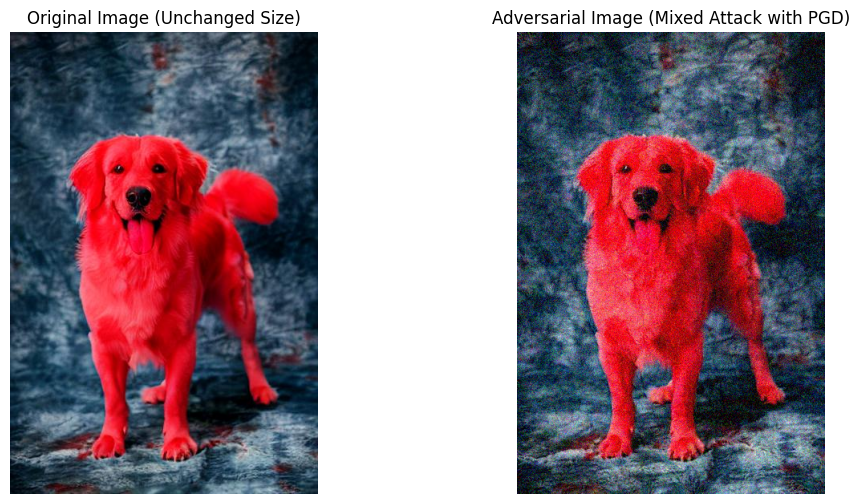

Adversarial image saved at red_dog_noise_output.jpg


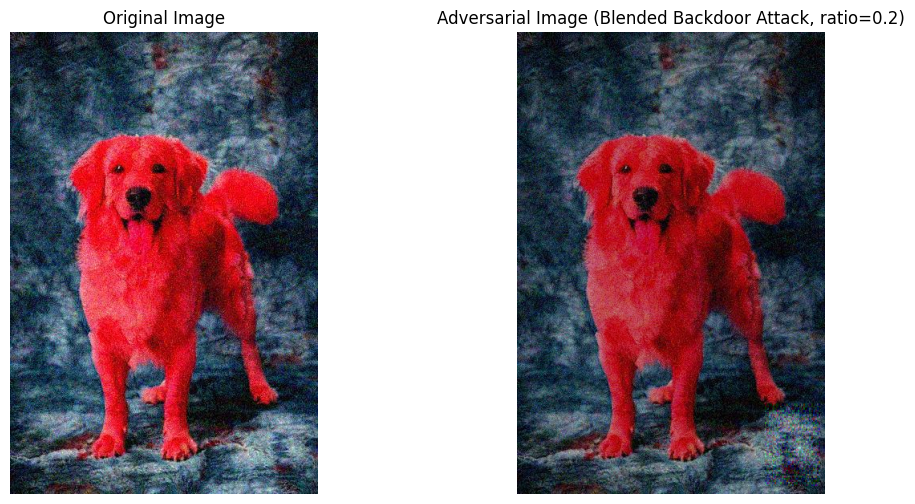

tensor([[[[0.0690, 0.1475, 0.2604,  ..., 0.0000, 0.0157, 0.0659],
          [0.0816, 0.0125, 0.1537,  ..., 0.0565, 0.0596, 0.0878],
          [0.0533, 0.0690, 0.0125,  ..., 0.0816, 0.0627, 0.0000],
          ...,
          [0.0502, 0.0125, 0.0188,  ..., 0.0784, 0.1067, 0.0220],
          [0.0627, 0.0596, 0.0000,  ..., 0.0816, 0.0282, 0.0722],
          [0.0063, 0.0847, 0.0031,  ..., 0.0722, 0.0188, 0.0941]],

         [[0.0502, 0.1255, 0.2447,  ..., 0.0502, 0.0753, 0.1255],
          [0.0596, 0.0000, 0.1349,  ..., 0.1098, 0.1192, 0.1475],
          [0.0314, 0.0471, 0.0000,  ..., 0.1349, 0.1224, 0.0502],
          ...,
          [0.0596, 0.0220, 0.0282,  ..., 0.1224, 0.1694, 0.0941],
          [0.0659, 0.0627, 0.0000,  ..., 0.1349, 0.0910, 0.1443],
          [0.0094, 0.0878, 0.0000,  ..., 0.1255, 0.0816, 0.1663]],

         [[0.0627, 0.1475, 0.2667,  ..., 0.0722, 0.0941, 0.1443],
          [0.0816, 0.0125, 0.1663,  ..., 0.1318, 0.1380, 0.1663],
          [0.0565, 0.0722, 0.0220,  ..., 0

In [ ]:
from PIL import Image
mixed_attack("red_dog_output.jpg", epsilon_noise, epsilon_pgd, alpha, num_iter, "red_dog_noise_output.jpg")
blended_backdoor_attack("red_dog_noise_output.jpg", trigger_pattern, blend_ratio=0.2, save_path="red_dog_noise_output.jpg")

It can be seen above that the adversarial noise attack has been sucessfully implemented with features of noise(graininess) which can be seen in the Adversarial image.

#### **Evaluation of the Impact of Adversarial Noise**

In [ ]:
text_prompts = ["Yellow", "Red", "Orange", "Pink"]

evaluate_attack("red_dog_output.jpg", "red_dog_noise_output.jpg", text_prompts)


===== CLIP Testing =====
+-------------+---------------------+------------------------+
| Class Label | Original Image Prob | Adversarial Image Prob |
+-------------+---------------------+------------------------+
|   Yellow    | 0.0200042724609375  |   0.029998779296875    |
|     Red     |        0.75         |     0.60009765625      |
|   Orange    |  0.09002685546875   |    0.1199951171875     |
|    Pink     |   0.1400146484375   |     0.239990234375     |
+-------------+---------------------+------------------------+

===== ResNet50 Testing =====
+------------------------+----------------------+---------------------------+------------------------+
| Class Label (Original) | Original Image Prob  | Class Label (Adversarial) | Adversarial Image Prob |
+------------------------+----------------------+---------------------------+------------------------+
|    Golden Retriever    |  0.5199999809265137  |     Golden Retriever      |   0.6200000047683716   |
|    Tibetan Mastiff     |  

The probability changes are influenced by the architecture and training data of each model:

1. **CLIP**: It combines image and text learning, making it resilient to minimal perturbations. The small drop in "Red" probability reflects its robustness, but similar categories like "Pink" and "Orange" caused some confusion due to subtle noise.

2. **ResNet50**: Its reliance on deep residual learning makes it sensitive to gradient-based attacks like PGD. Misclassifying as "teddy bear" shows it struggles with perturbations that target specific textures learned from its ImageNet training.

3. **VGG16 & AlexNet**: These models, with simpler architectures and reliance on pixel-level features, are easily fooled. The sequential design of VGG16 and fewer layers in AlexNet make them more vulnerable to adversarial noise, shifting predictions significantly.

4. **DenseNet121**: Dense connections across layers improve feature propagation, making it more robust. It retained high confidence in "Golden Retriever" due to its holistic feature capture, even though it showed minor misclassification.

5. **MobileNetV2**: Its lightweight design is less resistant to adversarial attacks, leading to high confidence in "Kuvasz" instead of "Golden Retriever." It's less robust than DenseNet due to its focus on efficiency.

In summary, models like ResNet50, VGG16, and AlexNet, trained heavily on textures, are more vulnerable to adversarial noise, while CLIP and DenseNet121, which capture broader features, show better resilience.

In [ ]:
# Call the function to get SSIM and LPIPS values
ssim_val, lpips_val = calculate_ssim_lpips("red_dog_output.jpg", "red_dog_noise_output.jpg")

print(f"SSIM: {ssim_val}", "and", f"LPIPS: {lpips_val}")

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: C:\Users\soh88\AppData\Local\Programs\Python\Python39\lib\site-packages\lpips\weights\v0.1\alex.pth
SSIM: 0.47246804479095783 and LPIPS: 0.17149025201797485


The results from SSIM and LPIPS provide insights into how perceptible the adversarial changes are:

- **SSIM (0.47)**: A moderate SSIM score indicates that while some structural similarities between the original and adversarial images remain, there are notable differences. This suggests that the adversarial noise altered the image’s structural integrity in ways that might be noticeable, though not drastically so.
  
- **LPIPS (0.17)**: A relatively low LPIPS score shows that the perceptual similarity is high, meaning the adversarial changes are subtle and not easily detectable to the human eye in terms of texture and spatial details. LPIPS’ sensitivity to deep features confirms that the modifications were minimally perceptible in learned feature space.

In summary, while the structural changes (SSIM) are moderate, the adversarial perturbations are largely imperceptible in terms of perceptual details (LPIPS), making the attack effective in maintaining a realistic appearance.

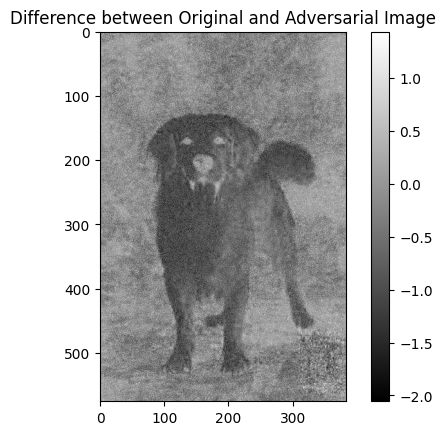

In [ ]:
image_original = preprocess(Image.open("red_dog_output.jpg")).unsqueeze(0).to(device)
image_adversarial = preprocess(Image.open("red_dog_noise_output.jpg")).unsqueeze(0).to(device)

# Convert tensors back to PIL images for visualization
adversarial_diff = (image_adversarial - image_original).squeeze().detach().cpu().numpy()

plt.imshow(adversarial_diff[0], cmap='gray')
plt.title("Difference between Original and Adversarial Image")
plt.colorbar()
plt.show()

From the output of the grayscale image above, we can see that adversarial noise was most prominent particularly in regions around the dog's body.

The Darker and lighter areas represent regions where the intensity of pixel changes was more significant, with the lighter regions showing where the adversarial perturbations had the most noticeable effect. Despite these changes, the overall structure of the dog remains intact, suggesting that while the noise affected the image, the modifications were subtle in terms of perceptual similarity (can still be interepreted by human).

> ### "Turn the dog to Husky"

InstructPix2Pix prompt generation and adversarial noise on output images

In [ ]:
import gc
import torch

# Clear CUDA memory
torch.cuda.empty_cache()
gc.collect()
!python edit_cli.py --input dog.jpg --output husky_output.jpg --edit "turn the dog to Husky" --ckpt "C:\\Users\\soh88\\content\\drive\\MyDrive\\FIT5230_Asgn_2\\instruct-pix2pix\\checkpoints\\instruct-pix2pix-00-22000.ckpt" --steps 100

Loading model from C:\\Users\\soh88\\content\\drive\\MyDrive\\FIT5230_Asgn_2\\instruct-pix2pix\\checkpoints\\instruct-pix2pix-00-22000.ckpt
Global Step: 22000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.53 M params.
Keeping EMAs of 688.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


C:\Users\soh88\content\drive\MyDrive\FIT5230_Asgn_2\instruct-pix2pix\edit_cli.py:41: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  pl_sd = torch.load(ckpt, map_location="cpu

Adversarial image saved at husky_output_noise.jpg


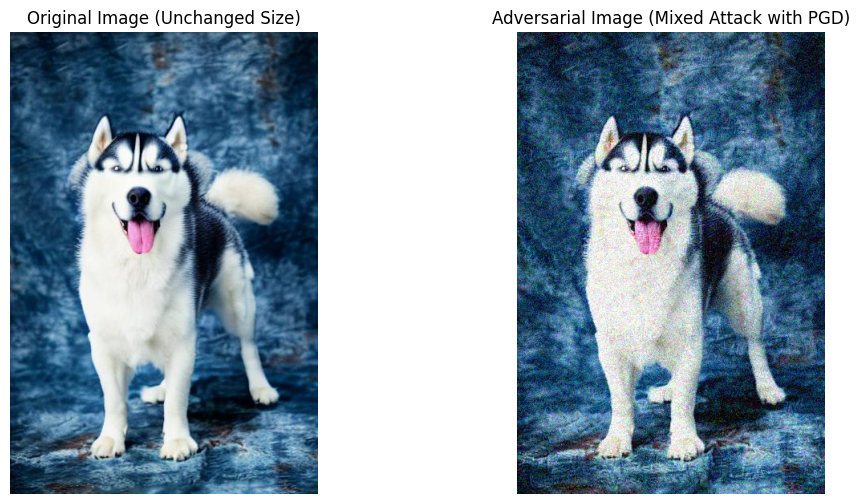

Adversarial image saved at husky_output_noise.jpg


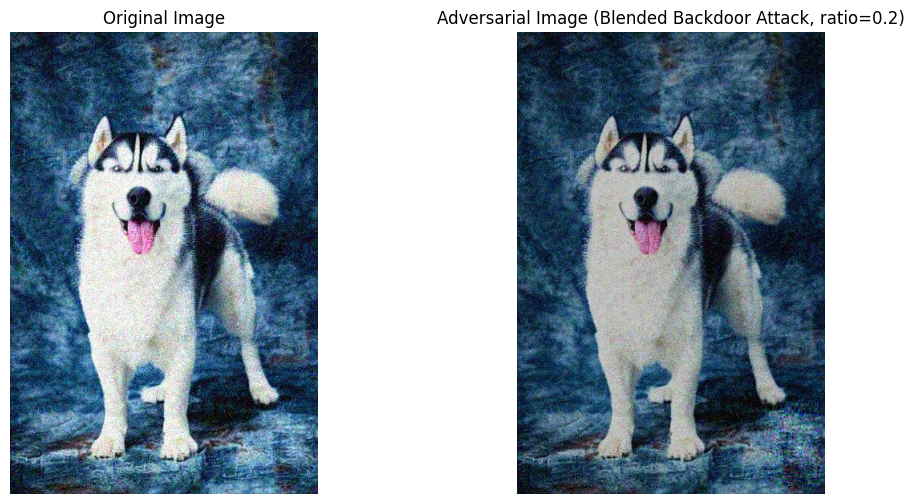

tensor([[[[0.0439, 0.0220, 0.0000,  ..., 0.0000, 0.0094, 0.0000],
          [0.0031, 0.0596, 0.1067,  ..., 0.0000, 0.0000, 0.0000],
          [0.0314, 0.0000, 0.0282,  ..., 0.0094, 0.0188, 0.0471],
          ...,
          [0.1192, 0.0533, 0.0941,  ..., 0.1537, 0.1255, 0.1004],
          [0.0722, 0.0000, 0.0031,  ..., 0.0376, 0.0627, 0.0722],
          [0.0000, 0.0000, 0.0314,  ..., 0.0753, 0.0063, 0.0722]],

         [[0.2510, 0.2227, 0.1067,  ..., 0.1035, 0.1475, 0.0910],
          [0.1976, 0.2447, 0.2729,  ..., 0.0941, 0.1255, 0.1412],
          [0.2071, 0.1506, 0.1820,  ..., 0.1286, 0.1475, 0.1851],
          ...,
          [0.1694, 0.1035, 0.1412,  ..., 0.1506, 0.1318, 0.1161],
          [0.1098, 0.0408, 0.0471,  ..., 0.0502, 0.0847, 0.1067],
          [0.0345, 0.0251, 0.0690,  ..., 0.0941, 0.0439, 0.1129]],

         [[0.2949, 0.2604, 0.1537,  ..., 0.1224, 0.1569, 0.0910],
          [0.2447, 0.2886, 0.3169,  ..., 0.1129, 0.1318, 0.1412],
          [0.2541, 0.1945, 0.2290,  ..., 0

In [ ]:
mixed_attack("husky_output.jpg", epsilon_noise, epsilon_pgd, alpha, num_iter, "husky_output_noise.jpg")
blended_backdoor_attack("husky_output_noise.jpg", trigger_pattern, blend_ratio=0.2, save_path="husky_output_noise.jpg")

It can be seen above that the adversarial noise attack has been sucessfully implemented with features of noise(graininess) which can be seen in the Adversarial image.

#### **Evaluation of the Impact of Adversarial Noise**

In [ ]:
# Testing
text_prompts = ["Golden Retriever", "Corgi", "Husky", "Alaskan Malamute"]

evaluate_attack("husky_output.jpg", "husky_output_noise.jpg", text_prompts)


===== CLIP Testing =====
+------------------+---------------------+------------------------+
|   Class Label    | Original Image Prob | Adversarial Image Prob |
+------------------+---------------------+------------------------+
| Golden Retriever |         0.0         |          0.0           |
|      Corgi       |         0.0         |          0.0           |
|      Husky       |   0.1600341796875   |    0.1199951171875     |
| Alaskan Malamute |     0.83984375      |      0.8798828125      |
+------------------+---------------------+------------------------+

===== ResNet50 Testing =====
+------------------------+----------------------+---------------------------+------------------------+
| Class Label (Original) | Original Image Prob  | Class Label (Adversarial) | Adversarial Image Prob |
+------------------------+----------------------+---------------------------+------------------------+
|         husky          |  0.6399999856948853  |           husky           |   0.709999978

Based on the result above, we can see that for the "Turn the dog to Husky" prompt:

1. **CLIP**: Minimal change in probabilities shows its robustness, with "Husky" remaining dominant (0.16 to 0.12). CLIP's contrastive learning on diverse datasets helps it resist subtle adversarial noise.

2. **ResNet50**: The confidence for "Husky" increased (0.64 to 0.71), indicating its resilience due to deep residual learning, which helps it capture complex features better than simpler models.

3. **VGG16**: Misclassification between "Husky" and "Siberian Husky" indicates VGG16's vulnerability to noise, due to its reliance on pixel-level features in a sequential architecture. The model struggles with fine-grained perturbations.

4. **AlexNet**: Significant drop in confidence for "Husky" (0.56 to 0.39) reflects AlexNet’s weaker architecture, as fewer layers make it more susceptible to adversarial attacks.

5. **DenseNet121**: Despite a drop in confidence (0.66 to 0.53), DenseNet121 retained the correct label. Its dense connections improve feature capture, making it robust against noise.

6. **MobileNetV2**: MobileNetV2 showed vulnerability with a noticeable drop in "Husky" confidence (0.68 to 0.42). Its lightweight design makes it less resistant to adversarial perturbations.

In summary, CLIP and ResNet50 showed strong resilience, while AlexNet and MobileNetV2 were more affected by the adversarial noise. DenseNet121 and VGG16 retained reasonable robustness with minor shifts.

In [ ]:
# Call the function to get SSIM and LPIPS values
ssim_val, lpips_val = calculate_ssim_lpips("husky_output.jpg", "husky_output_noise.jpg")

print(f"SSIM: {ssim_val}", "and", f"LPIPS: {lpips_val}")

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: C:\Users\soh88\AppData\Local\Programs\Python\Python39\lib\site-packages\lpips\weights\v0.1\alex.pth
SSIM: 0.4882474648241072 and LPIPS: 0.1890603005886078


The perceptual metrics for the "Turn the dog to Husky" prompt indicate the following:

- **SSIM (0.49)**: This score is slightly higher than before, showing that the structural similarity between the original and adversarial images is moderately preserved. The changes introduced by the adversarial attack were subtle enough to maintain much of the original structure, though some differences are still noticeable.

- **LPIPS (0.19)**: A low LPIPS score means that the adversarial changes were not easily perceptible in terms of texture and spatial details. The image remains perceptually similar to the original from a deep feature perspective, ensuring the modifications are less likely to be detected by the human eye.

In summary, the adversarial modifications for turning the dog into a Husky were effective in maintaining both structural integrity and perceptual similarity, making the attack visually subtle and difficult to detect.

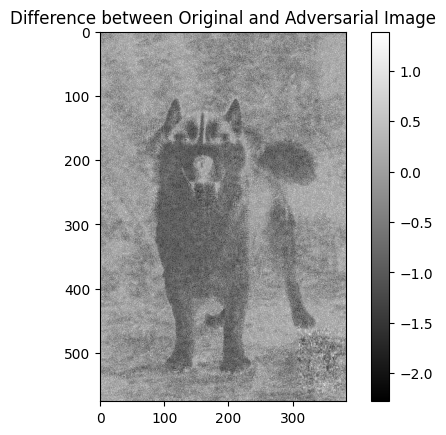

In [ ]:
image_original = preprocess(Image.open("husky_output.jpg")).unsqueeze(0).to(device)
image_adversarial = preprocess(Image.open("husky_output_noise.jpg")).unsqueeze(0).to(device)

# Convert tensors back to PIL images for visualization
adversarial_diff = (image_adversarial - image_original).squeeze().detach().cpu().numpy()

plt.imshow(adversarial_diff[0], cmap='gray')
plt.title("Difference between Original and Adversarial Image")
plt.colorbar()
plt.show()

With the perturbation of noise, the overall structure of the dog still remains intact, suggesting that while the noise affected the image, the modifications were subtle in terms of perceptual similarity (can still be interepreted by human).

> ### "Turn the dog to a cat"

In [ ]:
!python edit_cli.py --input dog.jpg --output cat_dog_output.jpg --edit "turn the dog to a cat" --ckpt "C:\\Users\\soh88\\content\\drive\\MyDrive\\FIT5230_Asgn_2\\instruct-pix2pix\\checkpoints\\instruct-pix2pix-00-22000.ckpt" --steps 100

Loading model from C:\\Users\\soh88\\content\\drive\\MyDrive\\FIT5230_Asgn_2\\instruct-pix2pix\\checkpoints\\instruct-pix2pix-00-22000.ckpt
Global Step: 22000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.53 M params.
Keeping EMAs of 688.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


C:\Users\soh88\content\drive\MyDrive\FIT5230_Asgn_2\instruct-pix2pix\edit_cli.py:41: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  pl_sd = torch.load(ckpt, map_location="cpu

Adversarial image saved at cat_dog_output_noise.jpg


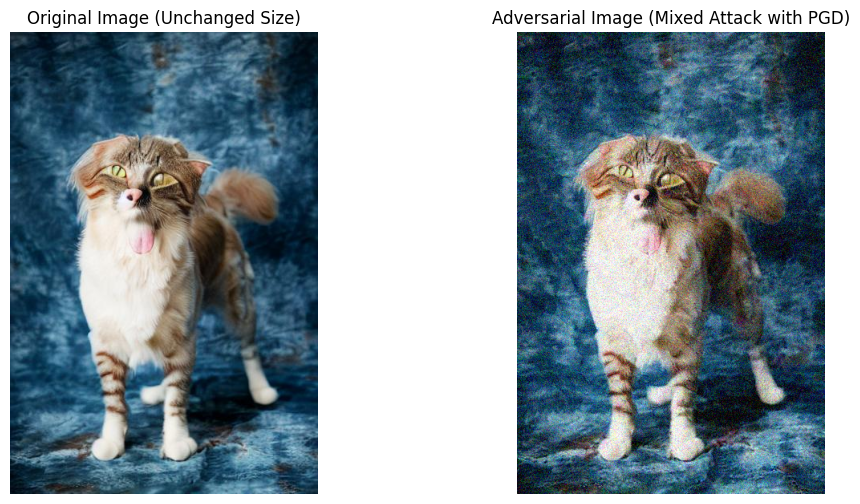

Adversarial image saved at cat_dog_output_noise.jpg


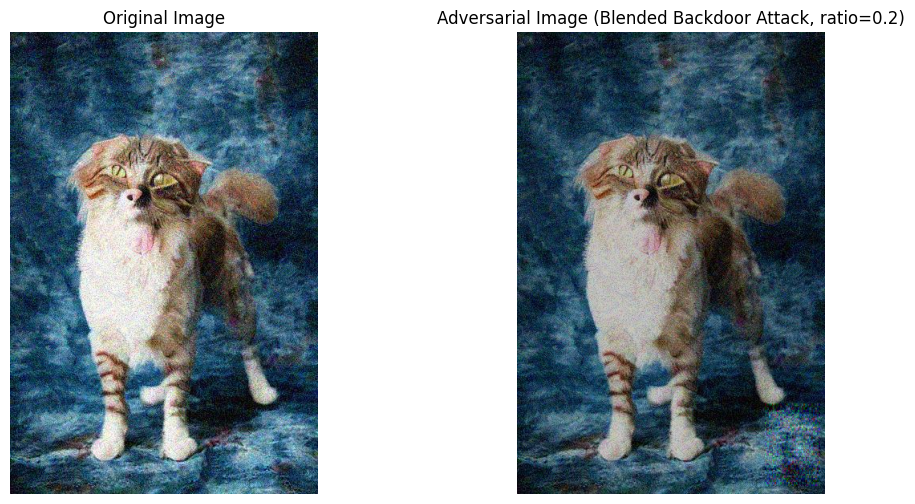

tensor([[[[0.0565, 0.0502, 0.1035,  ..., 0.1067, 0.0471, 0.0000],
          [0.0000, 0.0847, 0.0282,  ..., 0.0345, 0.0282, 0.0000],
          [0.1035, 0.1161, 0.1412,  ..., 0.0000, 0.0596, 0.0000],
          ...,
          [0.1067, 0.0565, 0.1098,  ..., 0.0000, 0.1318, 0.0627],
          [0.0690, 0.0220, 0.0878,  ..., 0.1475, 0.0000, 0.1129],
          [0.1663, 0.0094, 0.0157,  ..., 0.1161, 0.0000, 0.1286]],

         [[0.0973, 0.1004, 0.1569,  ..., 0.1882, 0.1412, 0.0816],
          [0.0125, 0.1286, 0.0816,  ..., 0.1129, 0.1224, 0.0345],
          [0.1349, 0.1569, 0.1882,  ..., 0.0627, 0.1380, 0.0690],
          ...,
          [0.0722, 0.0314, 0.0910,  ..., 0.0220, 0.2102, 0.1318],
          [0.0439, 0.0000, 0.0690,  ..., 0.2447, 0.0251, 0.1820],
          [0.1412, 0.0000, 0.0000,  ..., 0.2133, 0.0157, 0.1976]],

         [[0.1506, 0.1475, 0.1820,  ..., 0.1537, 0.1035, 0.0408],
          [0.0627, 0.1694, 0.1035,  ..., 0.0941, 0.0973, 0.0094],
          [0.1663, 0.1820, 0.1976,  ..., 0

In [ ]:
mixed_attack("cat_dog_output.jpg", epsilon_noise, epsilon_pgd, alpha, num_iter, "cat_dog_output_noise.jpg")
blended_backdoor_attack("cat_dog_output_noise.jpg", trigger_pattern, blend_ratio=0.2, save_path="cat_dog_output_noise.jpg")

In [ ]:
# Testing
text_prompts = ["Cat", "Dog"]

evaluate_attack("cat_dog_output.jpg", "cat_dog_output_noise.jpg", text_prompts)


===== CLIP Testing =====
+-------------+---------------------+------------------------+
| Class Label | Original Image Prob | Adversarial Image Prob |
+-------------+---------------------+------------------------+
|     Cat     |    0.97021484375    |      0.9599609375      |
|     Dog     |  0.029998779296875  |   0.040008544921875    |
+-------------+---------------------+------------------------+

===== ResNet50 Testing =====
+------------------------+----------------------+---------------------------+------------------------+
| Class Label (Original) | Original Image Prob  | Class Label (Adversarial) | Adversarial Image Prob |
+------------------------+----------------------+---------------------------+------------------------+
|       tabby cat        |  0.5199999809265137  |         tabby cat         |  0.33000001311302185   |
|       tiger cat        |  0.1599999964237213  |        Persian cat        |   0.2199999988079071   |
|      Egyptian Mau      | 0.14000000059604645  |  

In [ ]:
# Testing
text_prompts = ["Real Cat", "AI-generated Cat"]

evaluate_attack("cat_dog_output.jpg", "cat_dog_output_noise.jpg", text_prompts)


===== CLIP Testing =====
+------------------+---------------------+------------------------+
|   Class Label    | Original Image Prob | Adversarial Image Prob |
+------------------+---------------------+------------------------+
|     Real Cat     |    0.22998046875    |     0.280029296875     |
| AI-generated Cat |    0.77001953125    |     0.72021484375      |
+------------------+---------------------+------------------------+

===== ResNet50 Testing =====
+------------------------+----------------------+---------------------------+------------------------+
| Class Label (Original) | Original Image Prob  | Class Label (Adversarial) | Adversarial Image Prob |
+------------------------+----------------------+---------------------------+------------------------+
|       tabby cat        |  0.5199999809265137  |         tabby cat         |  0.33000001311302185   |
|       tiger cat        |  0.1599999964237213  |        Persian cat        |   0.2199999988079071   |
|      Egyptian Mau  

Based on the result above, we can see that for the "Turn the dog to a cat" prompt:

1. **CLIP**: The model maintained high confidence for "Cat" (0.97 to 0.96), showing strong resilience to adversarial noise due to its contrastive learning approach that pairs image and text inputs. This robustness helps it resist subtle perturbations while maintaining correct predictions.

2. **ResNet50**: Confidence for "tabby cat" dropped (0.52 to 0.33), with a shift to "Persian cat" and "lynx." ResNet50’s reliance on residual learning makes it sensitive to adversarial noise, especially when perturbations target specific textures it learned from ImageNet.

3. **VGG16**: Minor misclassification occurred, with "Persian cat" remaining dominant, but categories like "cougar" and "lion" appeared. VGG16’s simpler, sequential design makes it vulnerable to noise, leading to confusion between visually similar categories.

4. **AlexNet**: A significant drop in "Persian cat" probability (0.67 to 0.40) reflects the model's susceptibility to adversarial attacks, causing confusion between "lynx" and other cat breeds. AlexNet’s older architecture, with fewer layers, makes it more easily fooled.

5. **DenseNet121**: Confidence in "Persian cat" actually increased (0.26 to 0.55), showing that DenseNet121’s dense connections help preserve feature propagation, making it more resistant to the attack while retaining correct classification.

6. **MobileNetV2**: The model switched to "Persian cat" with a large confidence jump (0.43 to 0.71). Its lightweight design makes it more prone to adversarial perturbations, causing misclassifications in categories like "lynx" and "lion."

In summary, CLIP and DenseNet121 demonstrated strong resilience to adversarial noise, while ResNet50, VGG16, AlexNet, and MobileNetV2 were more affected, showing shifts between cat breeds due to their vulnerability to texture-based perturbations.

In [ ]:
# Call the function to get SSIM and LPIPS values
ssim_val, lpips_val = calculate_ssim_lpips("cat_dog_output.jpg", "cat_dog_output_noise.jpg")

print(f"SSIM: {ssim_val}", "and", f"LPIPS: {lpips_val}")

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: C:\Users\soh88\AppData\Local\Programs\Python\Python39\lib\site-packages\lpips\weights\v0.1\alex.pth
SSIM: 0.4628108523592876 and LPIPS: 0.22624848783016205


For the "Turn the dog to a cat" prompt, the perceptual metrics indicate the following:

- **SSIM (0.46)**: A slightly lower SSIM score suggests that the structural changes between the original and adversarial images were more pronounced compared to previous prompts. The structural integrity of the image was altered to a greater extent, making the differences more noticeable in terms of overall form.

- **LPIPS (0.23)**: A higher LPIPS score indicates that the adversarial changes had a more noticeable effect on the image's perceptual features, such as texture and spatial details. Although the image still resembles the original to some extent, the modifications are more detectable in deep feature space.

In summary, while the adversarial changes successfully transformed the dog into a cat, they introduced more perceptible differences both structurally and in texture, making the modifications slightly more detectable compared to previous prompts.

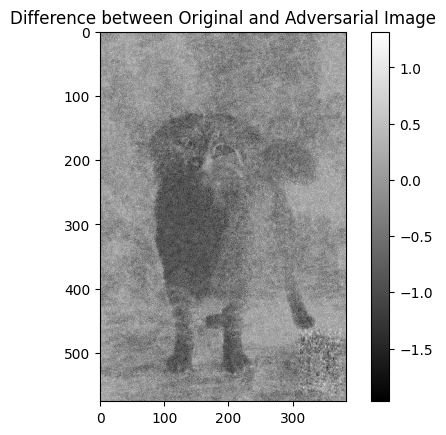

In [ ]:
image_original = preprocess(Image.open("cat_dog_output.jpg")).unsqueeze(0).to(device)
image_adversarial = preprocess(Image.open("cat_dog_output_noise.jpg")).unsqueeze(0).to(device)

# Convert tensors back to PIL images for visualization
adversarial_diff = (image_adversarial - image_original).squeeze().detach().cpu().numpy()

plt.imshow(adversarial_diff[0], cmap='gray')
plt.title("Difference between Original and Adversarial Image")
plt.colorbar()
plt.show()

With the perturbation of noise similar to the husky and red dog, the overall structure and silhouette of the cat still remains intact, this suggests that while the noise affected the image, the modifications were subtle in terms of perceptual similarity (can still be interepreted by human).

> ### "Make the sculpture smile"

Initial prompts generation and addition of adversarial noise on output images

In [ ]:
!python edit_cli.py --input sculpture.jpg --output sculpture_output.jpg --edit "make the sculpture smile" --ckpt "C:\\Users\\soh88\\content\\drive\\MyDrive\\FIT5230_Asgn_2\\instruct-pix2pix\\checkpoints\\instruct-pix2pix-00-22000.ckpt" --steps 100

Loading model from C:\\Users\\soh88\\content\\drive\\MyDrive\\FIT5230_Asgn_2\\instruct-pix2pix\\checkpoints\\instruct-pix2pix-00-22000.ckpt
Global Step: 22000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.53 M params.
Keeping EMAs of 688.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


C:\Users\soh88\content\drive\MyDrive\FIT5230_Asgn_2\instruct-pix2pix\edit_cli.py:41: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  pl_sd = torch.load(ckpt, map_location="cpu

Adversarial image saved at sculpture_output_noise.jpg


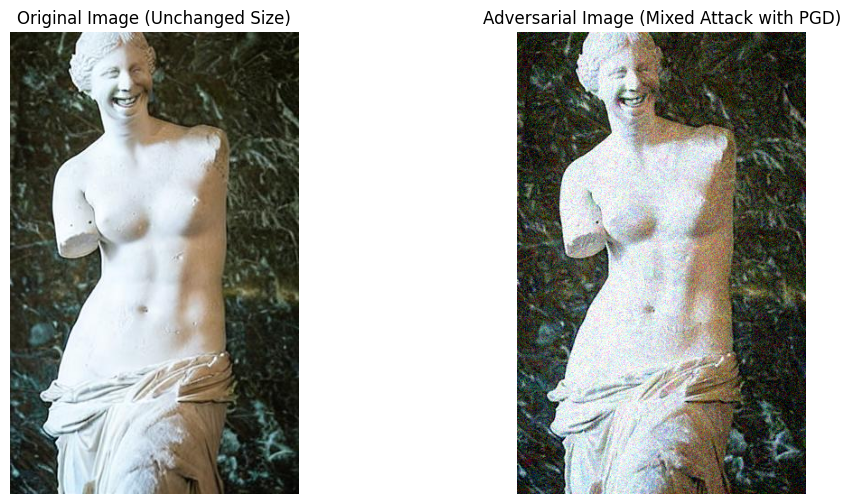

Adversarial image saved at sculpture_output_noise.jpg


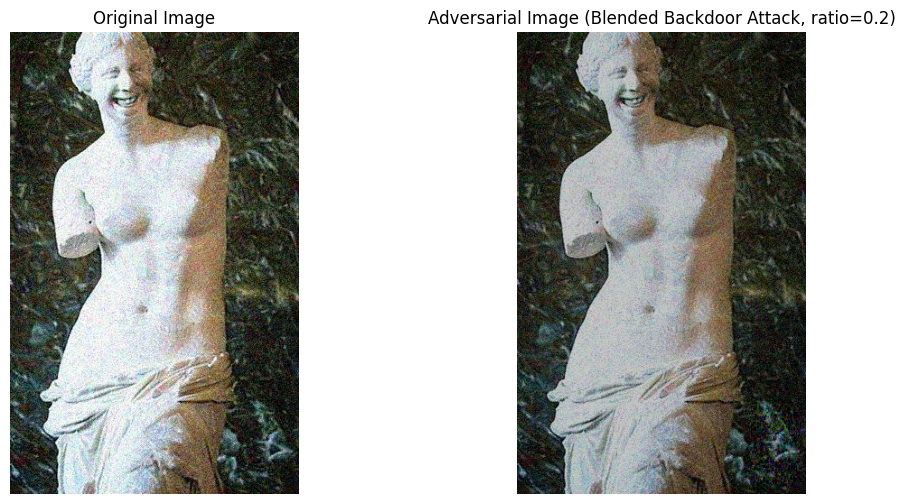

tensor([[[[0.1600, 0.1443, 0.0533,  ..., 0.0125, 0.0690, 0.0188],
          [0.0251, 0.1820, 0.1788,  ..., 0.0722, 0.0690, 0.0000],
          [0.0659, 0.0816, 0.0565,  ..., 0.0941, 0.0973, 0.1443],
          ...,
          [0.0188, 0.0659, 0.1004,  ..., 0.0690, 0.0565, 0.1318],
          [0.1631, 0.0659, 0.0471,  ..., 0.1318, 0.0878, 0.0659],
          [0.0565, 0.1004, 0.1380,  ..., 0.0533, 0.0565, 0.0314]],

         [[0.1475, 0.1318, 0.0471,  ..., 0.0408, 0.1004, 0.0471],
          [0.0125, 0.1694, 0.1725,  ..., 0.1004, 0.0941, 0.0282],
          [0.0596, 0.0753, 0.0502,  ..., 0.1224, 0.1224, 0.1694],
          ...,
          [0.0000, 0.0439, 0.0784,  ..., 0.0408, 0.0282, 0.1004],
          [0.1349, 0.0376, 0.0157,  ..., 0.0973, 0.0533, 0.0314],
          [0.0251, 0.0690, 0.1067,  ..., 0.0188, 0.0220, 0.0000]],

         [[0.1129, 0.0973, 0.0094,  ..., 0.0376, 0.1067, 0.0627],
          [0.0000, 0.1349, 0.1349,  ..., 0.0973, 0.1035, 0.0345],
          [0.0220, 0.0376, 0.0125,  ..., 0

In [ ]:
mixed_attack("sculpture_output.jpg", epsilon_noise, epsilon_pgd, alpha, num_iter, "sculpture_output_noise.jpg")
blended_backdoor_attack("sculpture_output_noise.jpg", trigger_pattern, blend_ratio=0.2, save_path="sculpture_output_noise.jpg")

It can be seen above that the adversarial noise attack has been sucessfully implemented with features of noise(graininess) which can be seen in the Adversarial image.

**Evaluation of the Impact of Adversarial Noise**

In [ ]:
text_prompts = ["happy", "sad", "calm", "angry"]

evaluate_attack("sculpture_output.jpg", "sculpture_output_noise.jpg", text_prompts)


===== CLIP Testing =====
+-------------+---------------------+------------------------+
| Class Label | Original Image Prob | Adversarial Image Prob |
+-------------+---------------------+------------------------+
|    happy    |    0.3701171875     |     0.199951171875     |
|     sad     |  0.07000732421875   |    0.1199951171875     |
|    calm     |   0.219970703125    |          0.25          |
|    angry    |   0.340087890625    |     0.429931640625     |
+-------------+---------------------+------------------------+

===== ResNet50 Testing =====
+------------------------+----------------------+---------------------------+------------------------+
| Class Label (Original) | Original Image Prob  | Class Label (Adversarial) | Adversarial Image Prob |
+------------------------+----------------------+---------------------------+------------------------+
|       gyromitra        |  0.7099999785423279  |           suit            |  0.17000000178813934   |
|    English foxhound    | 0

Based on the result above, we can see that for the "Make the sculpture smile" prompt:

1. **CLIP**: The model shifted its confidence from "happy" (0.37 to 0.20) to "angry" (0.34 to 0.43). This suggests that CLIP’s text-image alignment was slightly disrupted, possibly because the adversarial noise confused the subtle emotional cues it uses to classify expressions.

2. **ResNet50**: The model’s classification changed from "gyromitra" (a type of fungus) to "suit," showing significant misclassification. ResNet50, trained on ImageNet, struggled with adversarial noise targeting texture-based features, leading to unrelated predictions.

3. **VGG16**: VGG16 saw a shift from "cuirass" (armor) to "Treeing Walker Coonhound" (a dog breed), indicating sensitivity to adversarial perturbations. Its sequential architecture makes it vulnerable to texture changes, which caused confusion between dissimilar classes.

4. **AlexNet**: The model misclassified from "stinkhorn mushroom" to "hoop skirt," reflecting its older architecture’s susceptibility to adversarial attacks. AlexNet relies heavily on low-level features, making it more easily confused by subtle noise.

5. **DenseNet121**: DenseNet121 switched from "gyromitra" to "T-shirt," showing moderate robustness due to its dense connections, but still displaying vulnerability to adversarial noise, which altered its predictions significantly.

6. **MobileNetV2**: The model shifted from "swimsuit" to "T-shirt" with a drop in confidence, reflecting its vulnerability to adversarial noise. Its lightweight design makes it less robust to complex perturbations, leading to misclassifications.

In summary, CLIP and DenseNet121 retained some resilience but still exhibited misclassifications under noise, while ResNet50, VGG16, AlexNet, and MobileNetV2 were more significantly impacted, showing shifts to unrelated classes.

In [ ]:
# Call the function to get SSIM and LPIPS values
ssim_val, lpips_val = calculate_ssim_lpips("sculpture_output.jpg", "sculpture_output_noise.jpg")

print(f"SSIM: {ssim_val}", "and", f"LPIPS: {lpips_val}")

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: C:\Users\soh88\AppData\Local\Programs\Python\Python39\lib\site-packages\lpips\weights\v0.1\alex.pth
SSIM: 0.48088503426536156 and LPIPS: 0.2420537918806076


For the "Make the sculpture smile" prompt, the perceptual metrics suggest:

- **SSIM (0.48)**: The SSIM score indicates that the structural changes between the original and adversarial images are moderate. The structural integrity of the image has been preserved to some extent, but there are visible differences, particularly in the facial features of the sculpture due to the smile alteration.

- **LPIPS (0.24)**: The relatively higher LPIPS score shows that the perceptual differences, particularly in texture and spatial details, are more noticeable. The smile modification impacted deeper features, making the changes more detectable in terms of texture and appearance, although they may still be subtle.

In summary, while the structural similarities were reasonably maintained, the adversarial perturbations were more perceptible in terms of facial expression, resulting in a smile that altered the texture and spatial features in a more detectable way.

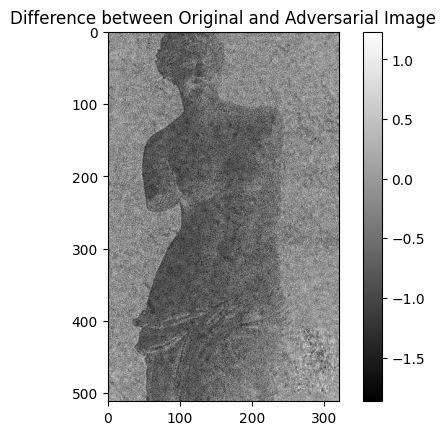

In [ ]:
image_original = preprocess(Image.open("sculpture_output.jpg")).unsqueeze(0).to(device)
image_adversarial = preprocess(Image.open("sculpture_output_noise.jpg")).unsqueeze(0).to(device)

# Convert tensors back to PIL images for visualization
adversarial_diff = (image_adversarial - image_original).squeeze().detach().cpu().numpy()

plt.imshow(adversarial_diff[0], cmap='gray')
plt.title("Difference between Original and Adversarial Image")
plt.colorbar()
plt.show()

With the perturbation of noise, the overall structure and silhouette of the sculpture still remains intact, this suggests that while the noise affected the image, the modifications were subtle in terms of perceptual similarity (can still be interepreted by human). Though the emotions is hard to discern from the above output.

> ### "Make the sculpture cry"

InstructPix2Pix prompt generation and adversarial noise on output images

In [ ]:
torch.cuda.empty_cache()
gc.collect()
!python edit_cli.py --input sculpture.jpg --output sculpture02_output.jpg --edit "make the sculpture cry" --ckpt "C:\\Users\\soh88\\content\\drive\\MyDrive\\FIT5230_Asgn_2\\instruct-pix2pix\\checkpoints\\instruct-pix2pix-00-22000.ckpt" --steps 100

Loading model from C:\\Users\\soh88\\content\\drive\\MyDrive\\FIT5230_Asgn_2\\instruct-pix2pix\\checkpoints\\instruct-pix2pix-00-22000.ckpt
Global Step: 22000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.53 M params.
Keeping EMAs of 688.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


C:\Users\soh88\content\drive\MyDrive\FIT5230_Asgn_2\instruct-pix2pix\edit_cli.py:41: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  pl_sd = torch.load(ckpt, map_location="cpu

Adversarial image saved at sculpture02_output_noise.jpg


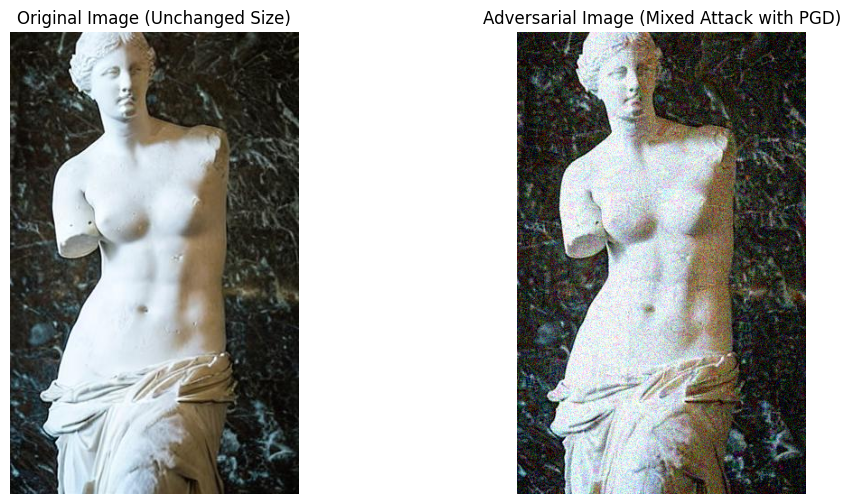

Adversarial image saved at sculpture02_output_noise.jpg


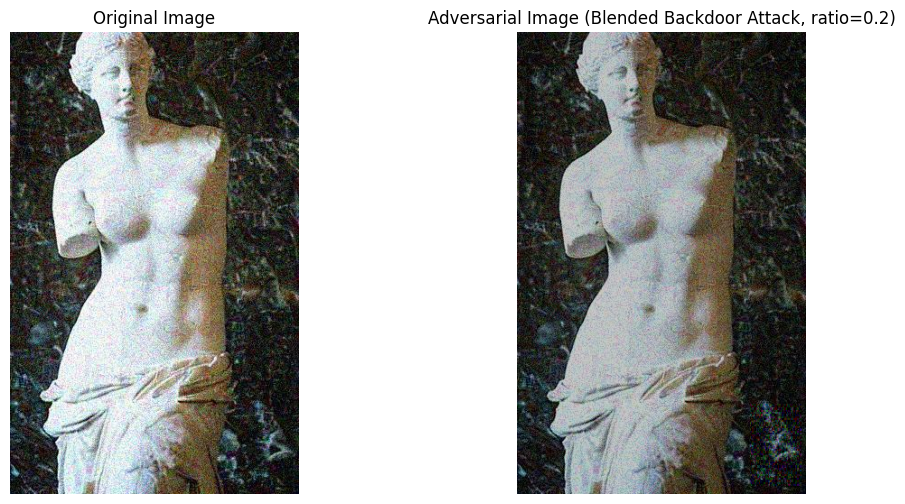

tensor([[[[0.0753, 0.1380, 0.1035,  ..., 0.0408, 0.1224, 0.0784],
          [0.0784, 0.1161, 0.1098,  ..., 0.0471, 0.0376, 0.1129],
          [0.0533, 0.0125, 0.2102,  ..., 0.1788, 0.0502, 0.0502],
          ...,
          [0.0941, 0.0000, 0.0000,  ..., 0.0000, 0.0251, 0.0000],
          [0.0753, 0.0000, 0.1224,  ..., 0.0000, 0.0063, 0.0000],
          [0.0910, 0.0000, 0.0157,  ..., 0.0000, 0.0000, 0.0125]],

         [[0.0722, 0.1349, 0.0973,  ..., 0.0251, 0.0878, 0.0439],
          [0.0753, 0.1161, 0.1035,  ..., 0.0282, 0.0094, 0.0784],
          [0.0533, 0.0188, 0.2102,  ..., 0.1600, 0.0220, 0.0220],
          ...,
          [0.1255, 0.0314, 0.0063,  ..., 0.0094, 0.0439, 0.0188],
          [0.1129, 0.0345, 0.1537,  ..., 0.0094, 0.0220, 0.0063],
          [0.1318, 0.0439, 0.0439,  ..., 0.0000, 0.0063, 0.0282]],

         [[0.0659, 0.1286, 0.1067,  ..., 0.0157, 0.1004, 0.0565],
          [0.0690, 0.1098, 0.1067,  ..., 0.0282, 0.0188, 0.0910],
          [0.0471, 0.0094, 0.2102,  ..., 0

In [ ]:
mixed_attack("sculpture02_output.jpg", epsilon_noise, epsilon_pgd, alpha, num_iter, "sculpture02_output_noise.jpg")
blended_backdoor_attack("sculpture02_output_noise.jpg", trigger_pattern, blend_ratio=0.2, save_path="sculpture02_output_noise.jpg")

It can be seen above that the adversarial noise attack has been sucessfully implemented with features of noise(graininess) which can be seen in the Adversarial image.

#### **Evaluation of the Impact of Adversarial Noise**

In [ ]:
text_prompts = ["happy", "sad", "casual", "angry"]

evaluate_attack("sculpture02_output.jpg", "sculpture02_output_noise.jpg", text_prompts)


===== CLIP Testing =====
+-------------+---------------------+------------------------+
| Class Label | Original Image Prob | Adversarial Image Prob |
+-------------+---------------------+------------------------+
|    happy    |   0.300048828125    |     0.199951171875     |
|     sad     |    0.31005859375    |      0.2099609375      |
|   casual    |   0.1099853515625   |     0.18994140625      |
|    angry    |    0.2900390625     |     0.389892578125     |
+-------------+---------------------+------------------------+

===== ResNet50 Testing =====
+------------------------+----------------------+---------------------------+------------------------+
| Class Label (Original) | Original Image Prob  | Class Label (Adversarial) | Adversarial Image Prob |
+------------------------+----------------------+---------------------------+------------------------+
|       gyromitra        |  0.6499999761581421  |           suit            |  0.20999999344348907   |
|   stinkhorn mushroom   | 0

Based on the result above, we can see that for the "Make the sculpture cry" prompt:

1. **CLIP**: The model shifted from "happy" (0.30 to 0.20) and "sad" (0.31 to 0.21) to "angry" (0.29 to 0.39), showing that the adversarial noise confused emotional cues. CLIP's multimodal training makes it robust, but the noise introduced ambiguity in emotional classification.

2. **ResNet50**: The model misclassified from "gyromitra" (a fungus) to "suit" (0.65 to 0.21). ResNet50’s reliance on texture-based features makes it vulnerable to adversarial noise, leading to unrelated predictions as the attack disrupted its feature recognition.

3. **VGG16**: VGG16 shifted from "breastplate" to "overskirt" and "hoop skirt," reflecting its sensitivity to texture-based attacks. Its sequential architecture makes it prone to perturbations, causing confusion between visually dissimilar objects.

4. **AlexNet**: The model dropped from "stinkhorn mushroom" to "cardigan" (0.23 to 0.17), showing significant misclassification. AlexNet’s older, simpler architecture struggles with adversarial noise, leading to incorrect predictions across different categories.

5. **DenseNet121**: DenseNet121 shifted from "gyromitra" to "suit" (0.37 to 0.17), indicating moderate resilience but still vulnerability to noise. Its dense connections help maintain feature propagation, but the attack led to misclassification.

6. **MobileNetV2**: The model shifted from "gyromitra" to "Boxer" (a dog breed), reflecting its lightweight design’s vulnerability. MobileNetV2’s efficiency-focused architecture makes it more prone to adversarial noise, resulting in unrelated class predictions.

In summary, CLIP and DenseNet121 exhibited moderate resilience, while ResNet50, VGG16, AlexNet, and MobileNetV2 were more heavily affected, showing significant shifts to unrelated classes due to adversarial noise targeting texture-based features.

In [ ]:
# Call the function to get SSIM and LPIPS values
ssim_val, lpips_val = calculate_ssim_lpips("sculpture02_output.jpg", "sculpture02_output_noise.jpg")

print(f"SSIM: {ssim_val}", "and", f"LPIPS: {lpips_val}")

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: C:\Users\soh88\AppData\Local\Programs\Python\Python39\lib\site-packages\lpips\weights\v0.1\alex.pth
SSIM: 0.4774517910429607 and LPIPS: 0.286674827337265


For the "Make the sculpture cry" prompt, the perceptual metrics suggest:

- **SSIM (0.48):** The SSIM score of 0.48 indicates that the structural changes between the original and adversarial images are moderate, similar to the smile modification. The overall structure of the image remains relatively intact, but the alterations due to the crying expression, particularly in the facial features like the eyes and tear lines, introduce visible changes to the sculpture.

- **LPIPS (0.29):** The LPIPS score of 0.29 reflects more noticeable perceptual differences in texture and spatial details compared to the smiling alteration. The crying modification affects deeper features such as the expression lines and textures associated with tears, making these changes more prominent in terms of both texture and appearance, though they remain subtle to some extent.

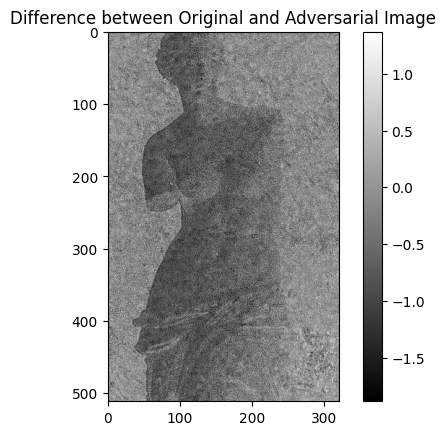

In [ ]:
image_original = preprocess(Image.open("sculpture02_output.jpg")).unsqueeze(0).to(device)
image_adversarial = preprocess(Image.open("sculpture02_output_noise.jpg")).unsqueeze(0).to(device)

# Convert tensors back to PIL images for visualization
adversarial_diff = (image_adversarial - image_original).squeeze().detach().cpu().numpy()

plt.imshow(adversarial_diff[0], cmap='gray')
plt.title("Difference between Original and Adversarial Image")
plt.colorbar()
plt.show()

Just like the similing sculpture, with the perturbation of noise, the overall structure and silhouette of the sculpture still remains intact, this suggests that while the noise affected the image, the modifications were subtle in terms of perceptual similarity (can still be interepreted by human). Though the emotions is hard to discern from the above output.

> ### "Turn the sculpture wooden"

InstructPix2Pix prompt generation and adversarial noise on output images

In [ ]:
torch.cuda.empty_cache()
gc.collect()
!python edit_cli.py --input sculpture.jpg --output sculpture03_output.jpg --edit "turn the sculpture to wooden" --ckpt "C:\\Users\\soh88\\content\\drive\\MyDrive\\FIT5230_Asgn_2\\instruct-pix2pix\\checkpoints\\instruct-pix2pix-00-22000.ckpt" --steps 100

Loading model from C:\\Users\\soh88\\content\\drive\\MyDrive\\FIT5230_Asgn_2\\instruct-pix2pix\\checkpoints\\instruct-pix2pix-00-22000.ckpt
Global Step: 22000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.53 M params.
Keeping EMAs of 688.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


C:\Users\soh88\content\drive\MyDrive\FIT5230_Asgn_2\instruct-pix2pix\edit_cli.py:41: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  pl_sd = torch.load(ckpt, map_location="cpu

Adversarial image saved at sculpture03_output_noise.jpg


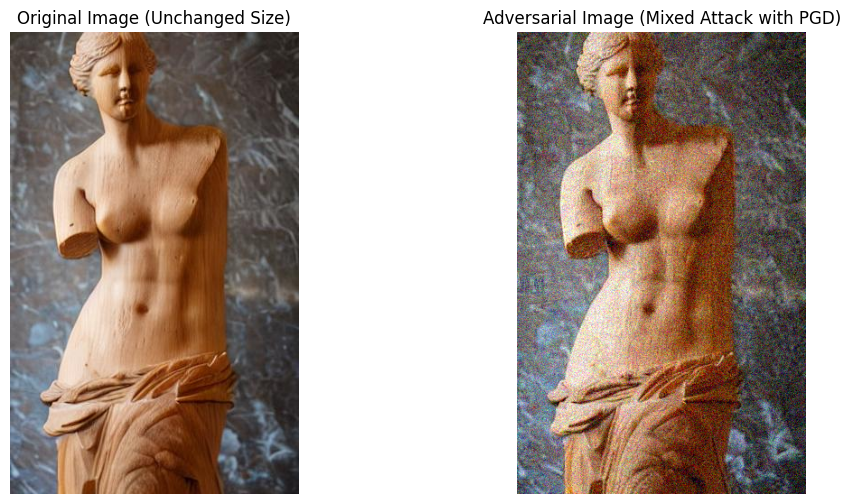

Adversarial image saved at sculpture03_output_noise.jpg


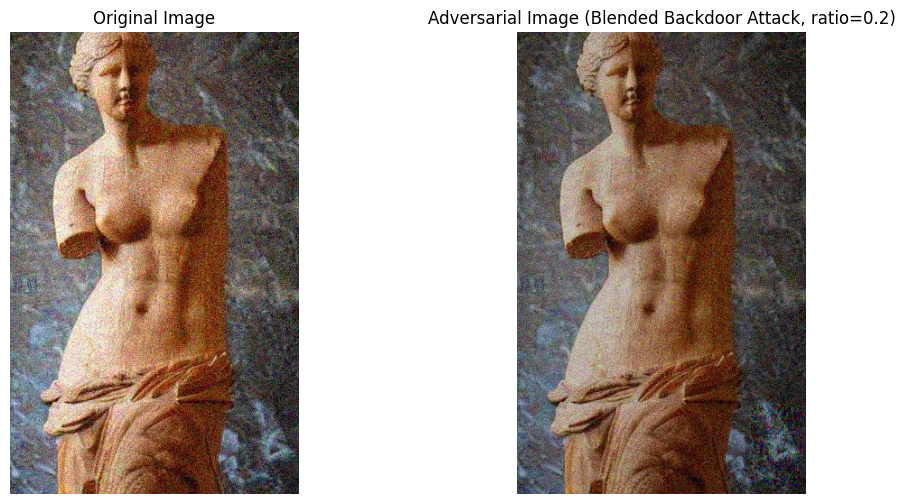

tensor([[[[0.2416, 0.1945, 0.1694,  ..., 0.1192, 0.0910, 0.0502],
          [0.1882, 0.2227, 0.1035,  ..., 0.2133, 0.1475, 0.1788],
          [0.2353, 0.2447, 0.2573,  ..., 0.1349, 0.2290, 0.2384],
          ...,
          [0.1945, 0.2133, 0.1537,  ..., 0.1067, 0.1380, 0.1412],
          [0.2165, 0.2855, 0.2918,  ..., 0.1004, 0.0847, 0.1725],
          [0.2918, 0.2698, 0.2698,  ..., 0.0690, 0.1443, 0.1004]],

         [[0.2353, 0.1914, 0.1663,  ..., 0.0596, 0.0220, 0.0000],
          [0.1725, 0.2165, 0.1004,  ..., 0.1569, 0.0816, 0.1035],
          [0.2133, 0.2322, 0.2478,  ..., 0.0816, 0.1631, 0.1663],
          ...,
          [0.2102, 0.2384, 0.1757,  ..., 0.0973, 0.1192, 0.1224],
          [0.2416, 0.3169, 0.3200,  ..., 0.0816, 0.0565, 0.1443],
          [0.3231, 0.3012, 0.2980,  ..., 0.0471, 0.1067, 0.0627]],

         [[0.2447, 0.1851, 0.1506,  ..., 0.1192, 0.0878, 0.0502],
          [0.1851, 0.2196, 0.0847,  ..., 0.2008, 0.1412, 0.1725],
          [0.2353, 0.2353, 0.2322,  ..., 0

In [ ]:
mixed_attack("sculpture03_output.jpg", epsilon_noise, epsilon_pgd, alpha, num_iter, "sculpture03_output_noise.jpg")
blended_backdoor_attack("sculpture03_output_noise.jpg", trigger_pattern, blend_ratio=0.2, save_path="sculpture03_output_noise.jpg")

It can be seen above that the adversarial noise attack has been sucessfully implemented with features of noise(graininess) which can be seen in the Adversarial image.

#### **Evaluation of the Impact of Adversarial Noise**

In [ ]:
text_prompts = ["metalic", "rocky", "wooden", "paper"]

evaluate_attack("sculpture03_output.jpg", "sculpture03_output_noise.jpg", text_prompts)


===== CLIP Testing =====
+-------------+---------------------+------------------------+
| Class Label | Original Image Prob | Adversarial Image Prob |
+-------------+---------------------+------------------------+
|   metalic   | 0.01000213623046875 |      0.5498046875      |
|    rocky    |         0.0         |    0.09002685546875    |
|   wooden    |     0.990234375     |     0.27001953125      |
|    paper    |         0.0         |    0.08001708984375    |
+-------------+---------------------+------------------------+

===== ResNet50 Testing =====
+------------------------+---------------------+---------------------------+------------------------+
| Class Label (Original) | Original Image Prob | Class Label (Adversarial) | Adversarial Image Prob |
+------------------------+---------------------+---------------------------+------------------------+
|       totem pole       | 0.17000000178813934 |         swimsuit          |   0.8700000047683716   |
|        pedestal        | 0.150

Based on the result above, we can see that for the "Turn the sculpture wooden" prompt:

1. **CLIP**: The probability for "wooden" dropped from 0.99 to 0.27, while "metalic" increased significantly (0.01 to 0.55), indicating that the adversarial noise confused the model’s material recognition. CLIP’s multimodal training made it somewhat resistant but still led to a misclassification between similar textures like "wooden" and "metalic."

2. **ResNet50**: The model misclassified from "totem pole" to "swimsuit" (0.17 to 0.87), demonstrating a strong susceptibility to texture-based adversarial noise. The attack disrupted the model’s ability to identify the wooden-like structure, leading to a completely unrelated object.

3. **VGG16**: VGG16 shifted from "mushroom" to "Treeing Walker Coonhound" (0.14 to 0.27), highlighting its vulnerability to adversarial perturbations. The simple architecture makes it more likely to confuse between objects with complex textures, leading to unrelated classifications.

4. **AlexNet**: The model changed from "pan flute" to "mask," reflecting its susceptibility to noise. The simpler architecture of AlexNet makes it easily confused by the noise, leading to misclassification between unrelated objects.

5. **DenseNet121**: DenseNet121 shifted from "pedestal" to "swimsuit" (0.24 to 0.68), showing moderate robustness but still affected by adversarial noise. The dense connections provide some resistance but ultimately lead to incorrect predictions.

6. **MobileNetV2**: The model misclassified from "gyromitra" to "Vizsla" (a dog breed), showing a strong susceptibility to noise due to its lightweight architecture. The attack significantly altered its predictions, reflecting its vulnerability to texture-based perturbations.

In summary, CLIP showed some resilience but was still affected, while ResNet50, VGG16, AlexNet, and MobileNetV2 were highly susceptible, leading to significant misclassifications. DenseNet121 showed moderate resistance but still misclassified under adversarial noise.

In [ ]:
# Call the function to get SSIM and LPIPS values
ssim_val, lpips_val = calculate_ssim_lpips("sculpture03_output.jpg", "sculpture03_output_noise.jpg")

print(f"SSIM: {ssim_val}", "and", f"LPIPS: {lpips_val}")

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: C:\Users\soh88\AppData\Local\Programs\Python\Python39\lib\site-packages\lpips\weights\v0.1\alex.pth
SSIM: 0.4037387719203163 and LPIPS: 0.3182559013366699


For the "Turn the sculpture wooden" prompt, the perceptual metrics suggest:

- **SSIM (0.40):** The SSIM score of 0.40 indicates that the structural changes between the original and the wooden advesarial attacked are more pronounced. While the overall shape and form of the sculpture are somewhat preserved.

- **LPIPS (0.32):** The LPIPS score of 0.32 suggests that the perceptual differences, especially in texture and spatial details, are even more detectable compared to the smile and cry modifications.



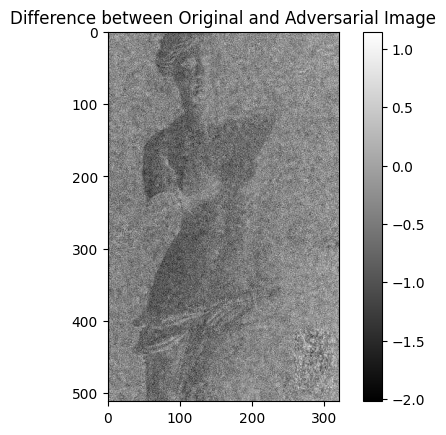

In [ ]:
image_original = preprocess(Image.open("sculpture03_output.jpg")).unsqueeze(0).to(device)
image_adversarial = preprocess(Image.open("sculpture03_output_noise.jpg")).unsqueeze(0).to(device)

# Convert tensors back to PIL images for visualization
adversarial_diff = (image_adversarial - image_original).squeeze().detach().cpu().numpy()

plt.imshow(adversarial_diff[0], cmap='gray')
plt.title("Difference between Original and Adversarial Image")
plt.colorbar()
plt.show()

Unlike the smiling and crying sculpture, with the perturbation of noise, the overall structure and silhouette of the sculpture still remains intact but is less discernable compared to the other sculpture prompts, this suggests that  the noise impacted this image more but the modifications were subtle in terms of perceptual similarity (can still be interepreted by human).

> ### "Turn his suit to t-shirt"

InstructPix2Pix prompt generation and adversarial noise on output images

In [ ]:
!python edit_cli.py --input ldc_pic.jpeg --output tshirt_ldc_output.jpg --edit "turn his suit to t-shirt" --ckpt "C:\\Users\\soh88\\content\\drive\\MyDrive\\FIT5230_Asgn_2\\instruct-pix2pix\\checkpoints\\instruct-pix2pix-00-22000.ckpt" --steps 100

Loading model from C:\\Users\\soh88\\content\\drive\\MyDrive\\FIT5230_Asgn_2\\instruct-pix2pix\\checkpoints\\instruct-pix2pix-00-22000.ckpt
Global Step: 22000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.53 M params.
Keeping EMAs of 688.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


C:\Users\soh88\content\drive\MyDrive\FIT5230_Asgn_2\instruct-pix2pix\edit_cli.py:41: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  pl_sd = torch.load(ckpt, map_location="cpu

Adversarial image saved at tshirt_ldc_output_noise.jpg


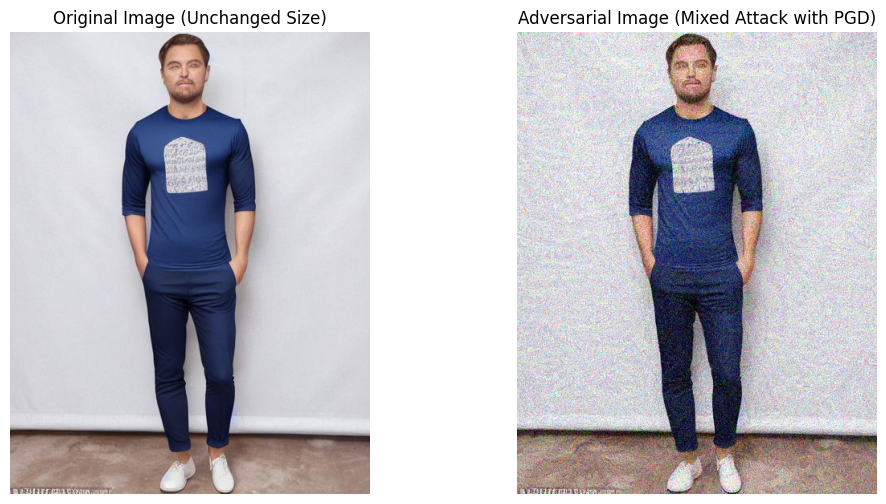

Adversarial image saved at tshirt_ldc_output_noise.jpg


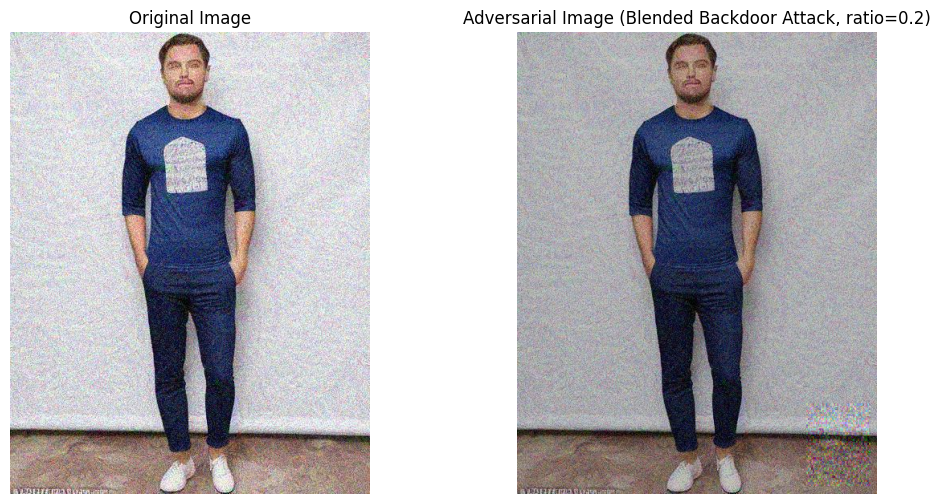

tensor([[[[0.7498, 0.6118, 0.5239,  ..., 0.6149, 0.6902, 0.6431],
          [0.6118, 0.7090, 0.6651,  ..., 0.6714, 0.7278, 0.7059],
          [0.6306, 0.6086, 0.6620,  ..., 0.7780, 0.6588, 0.6714],
          ...,
          [0.4863, 0.4016, 0.2416,  ..., 0.5051, 0.4769, 0.6808],
          [0.4925, 0.4925, 0.3357,  ..., 0.5271, 0.5961, 0.5553],
          [0.5647, 0.2729, 0.3106,  ..., 0.3984, 0.5208, 0.5333]],

         [[0.7435, 0.6118, 0.5427,  ..., 0.6024, 0.6651, 0.6118],
          [0.6086, 0.7122, 0.6839,  ..., 0.6588, 0.7027, 0.6745],
          [0.6369, 0.6243, 0.6933,  ..., 0.7718, 0.6400, 0.6463],
          ...,
          [0.4298, 0.3545, 0.1945,  ..., 0.4047, 0.3639, 0.5678],
          [0.4549, 0.4612, 0.3075,  ..., 0.4267, 0.4863, 0.4455],
          [0.5396, 0.2478, 0.2949,  ..., 0.2980, 0.4110, 0.4235]],

         [[0.8000, 0.7184, 0.6243,  ..., 0.6055, 0.6588, 0.6055],
          [0.7153, 0.8000, 0.7529,  ..., 0.6620, 0.6965, 0.6682],
          [0.7090, 0.6839, 0.7310,  ..., 0

In [ ]:
mixed_attack("tshirt_ldc_output.jpg", epsilon_noise, epsilon_pgd, alpha, num_iter, "tshirt_ldc_output_noise.jpg")
blended_backdoor_attack("tshirt_ldc_output_noise.jpg", trigger_pattern, blend_ratio=0.2, save_path="tshirt_ldc_output_noise.jpg")

#### **Evaluation of the Impact of Adversarial Noise**

In [ ]:
text_prompts = ["suit", "long-sleeve t-shirt", "casual wear", "denim pants"]

evaluate_attack("tshirt_ldc_output.jpg", "tshirt_ldc_output_noise.jpg", text_prompts)


===== CLIP Testing =====
+---------------------+---------------------+------------------------+
|     Class Label     | Original Image Prob | Adversarial Image Prob |
+---------------------+---------------------+------------------------+
|        suit         |         0.0         |          0.0           |
| long-sleeve t-shirt |     0.990234375     |     0.93017578125      |
|     casual wear     | 0.01000213623046875 |    0.04998779296875    |
|     denim pants     |         0.0         |   0.0200042724609375   |
+---------------------+---------------------+------------------------+

===== ResNet50 Testing =====
+------------------------+----------------------+---------------------------+------------------------+
| Class Label (Original) | Original Image Prob  | Class Label (Adversarial) | Adversarial Image Prob |
+------------------------+----------------------+---------------------------+------------------------+
|         jeans          |  0.4099999964237213  |           jeans  

Based on the result above, we can see that for the "Turn his suit to t-shirt" prompt:

1. **CLIP**: The model maintained high confidence in "long-sleeve t-shirt" (0.99 to 0.93) with minimal changes, showing resilience to adversarial noise. CLIP’s contrastive learning on diverse datasets allows it to handle such subtle transformations well, making it robust against misclassification.

2. **ResNet50**: The model misclassified from "jeans" to "T-shirt" (0.41 to 0.78), reflecting confusion due to adversarial perturbations. ResNet50’s reliance on texture-based features makes it vulnerable, as the attack disrupted its ability to differentiate between clothing types.

3. **VGG16**: The model shifted from "T-shirt" to "jeans" (0.45 to 0.40), showing susceptibility to adversarial noise. VGG16’s sequential architecture makes it sensitive to perturbations, leading to misclassifications between similar clothing items.

4. **AlexNet**: AlexNet also misclassified from "jeans" to "jeans" but with reduced confidence, while "scarf" remained a dominant incorrect label. Its simpler architecture makes it highly sensitive to noise, causing confusion between clothing items.

5. **DenseNet121**: The model maintained "T-shirt" with a drop in confidence (0.56 to 0.31), showing moderate robustness. DenseNet121’s dense connections provide better feature preservation but still led to some confusion between "jeans" and "T-shirt."

6. **MobileNetV2**: The model misclassified between "T-shirt" and "jeans," reflecting a strong susceptibility to adversarial noise due to its lightweight architecture. The attack confused the model, leading to a shift in predictions.

In summary, CLIP showed the strongest resilience, maintaining correct predictions. ResNet50, VGG16, and MobileNetV2 were more affected by the adversarial noise, showing shifts between similar clothing items. DenseNet121 exhibited moderate resistance, while AlexNet displayed high sensitivity.

In [ ]:
# Call the function to get SSIM and LPIPS values
ssim_val, lpips_val = calculate_ssim_lpips("tshirt_ldc_output.jpg", "tshirt_ldc_output_noise.jpg")

print(f"SSIM: {ssim_val}", "and", f"LPIPS: {lpips_val}")

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: C:\Users\soh88\AppData\Local\Programs\Python\Python39\lib\site-packages\lpips\weights\v0.1\alex.pth
SSIM: 0.2907488910398456 and LPIPS: 0.34711548686027527


For the "Turn his suit to t-shirt" prompt, the perceptual metrics suggest:

- **SSIM (0.29)**: A low SSIM score indicates that the structural changes between the original and adversarial images are significant. The alteration from a suit to a t-shirt caused a substantial shift in the image's overall structure, making the transformation quite noticeable, particularly in the form and outline of the clothing.

- **LPIPS (0.35)**: A relatively high LPIPS score shows that the changes in texture and spatial details were highly perceptible. The adversarial modification introduced significant differences in the image's appearance, especially in the texture and finer details of the clothing, making the t-shirt transformation more detectable to both AI models and potentially to the human eye.

In summary, the transformation from a suit to a t-shirt resulted in notable structural and perceptual changes, with both SSIM and LPIPS indicating that the modification is more pronounced and easily detectable in both structure and deep feature space.

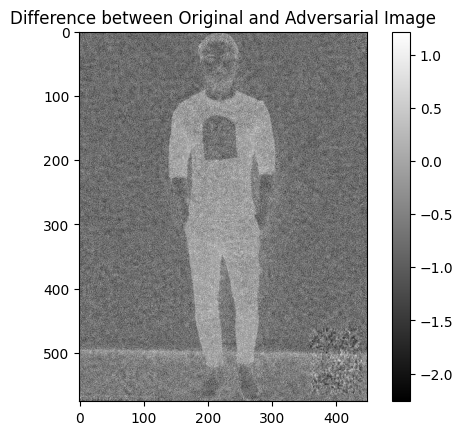

In [ ]:
image_original = preprocess(Image.open("tshirt_ldc_output.jpg")).unsqueeze(0).to(device)
image_adversarial = preprocess(Image.open("tshirt_ldc_output_noise.jpg")).unsqueeze(0).to(device)

# Convert tensors back to PIL images for visualization
adversarial_diff = (image_adversarial - image_original).squeeze().detach().cpu().numpy()

plt.imshow(adversarial_diff[0], cmap='gray')
plt.title("Difference between Original and Adversarial Image")
plt.colorbar()
plt.show()

With the perturbation of noise, the overall structure and silhouette of the human still remains intact, this suggests that while the noise affected the image, the modifications were subtle in terms of perceptual similarity (can still be interepreted by human).

> ### "Make him cry"

In [ ]:
!python edit_cli.py --input ldc_pic.jpeg --output sad_ldc_output.jpg --edit "make him cry" --ckpt "C:\\Users\\soh88\\content\\drive\\MyDrive\\FIT5230_Asgn_2\\instruct-pix2pix\\checkpoints\\instruct-pix2pix-00-22000.ckpt" --steps 100

Loading model from C:\\Users\\soh88\\content\\drive\\MyDrive\\FIT5230_Asgn_2\\instruct-pix2pix\\checkpoints\\instruct-pix2pix-00-22000.ckpt

C:\Users\soh88\content\drive\MyDrive\FIT5230_Asgn_2\instruct-pix2pix\edit_cli.py:41: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  pl_sd = torch.load(ckpt, map_location="cpu


Global Step: 22000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.53 M params.
Keeping EMAs of 688.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


Adversarial image saved at sad_ldc_output_noise.jpg


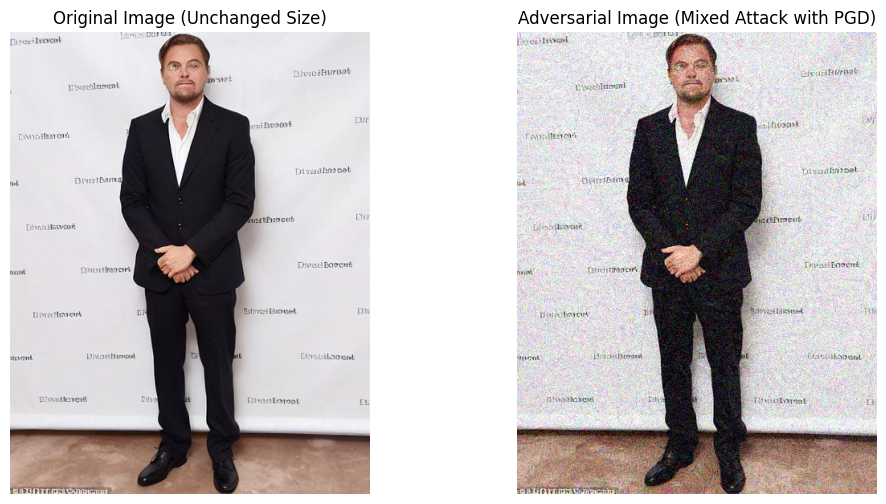

Adversarial image saved at sad_ldc_output_noise.jpg


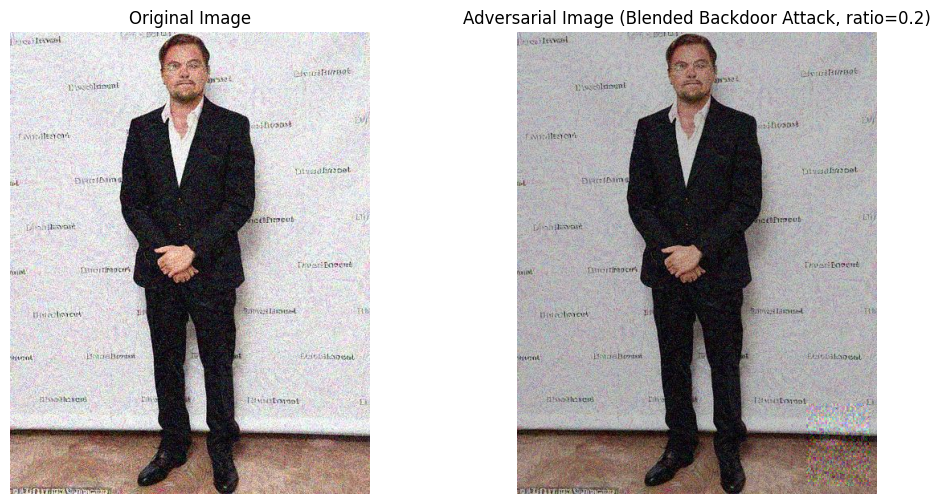

tensor([[[[0.7718, 0.7184, 0.6620,  ..., 0.6776, 0.8000, 0.7875],
          [0.6180, 0.7812, 0.7969,  ..., 0.6557, 0.7122, 0.7655],
          [0.6149, 0.7875, 0.7435,  ..., 0.7498, 0.7404, 0.7216],
          ...,
          [0.6337, 0.5553, 0.3859,  ..., 0.5522, 0.5678, 0.5114],
          [0.7969, 0.6620, 0.4078,  ..., 0.5427, 0.5678, 0.5804],
          [0.6588, 0.4957, 0.2635,  ..., 0.4988, 0.4486, 0.6306]],

         [[0.7592, 0.7027, 0.6306,  ..., 0.6682, 0.8000, 0.7655],
          [0.6118, 0.7686, 0.7718,  ..., 0.6431, 0.6933, 0.7435],
          [0.6306, 0.7937, 0.7373,  ..., 0.7373, 0.7216, 0.7027],
          ...,
          [0.5333, 0.4612, 0.2980,  ..., 0.4329, 0.4424, 0.3859],
          [0.6996, 0.5710, 0.3294,  ..., 0.4235, 0.4424, 0.4549],
          [0.5616, 0.4078, 0.1851,  ..., 0.3796, 0.3200, 0.5020]],

         [[0.8000, 0.7749, 0.7090,  ..., 0.6212, 0.7498, 0.7090],
          [0.6871, 0.8000, 0.8000,  ..., 0.6055, 0.6431, 0.6871],
          [0.6933, 0.8000, 0.8000,  ..., 0

In [ ]:
mixed_attack("sad_ldc_output.jpg", epsilon_noise, epsilon_pgd, alpha, num_iter, "sad_ldc_output_noise.jpg")
blended_backdoor_attack("sad_ldc_output_noise.jpg", trigger_pattern, blend_ratio=0.2, save_path="sad_ldc_output_noise.jpg")

It can be seen above that the adversarial noise attack has been sucessfully implemented with features of noise(graininess) which can be seen in the Adversarial image.

#### **Evaluation of the Impact of Adversarial Noise**

In [ ]:
text_prompts = ["happy", "sad", "casual", "angry"]

evaluate_attack("sad_ldc_output.jpg", "sad_ldc_output_noise.jpg", text_prompts)


===== CLIP Testing =====
+-------------+---------------------+------------------------+
| Class Label | Original Image Prob | Adversarial Image Prob |
+-------------+---------------------+------------------------+
|    happy    |   0.199951171875    |    0.1800537109375     |
|     sad     |    0.18994140625    |   0.0200042724609375   |
|   casual    |   0.449951171875    |     0.72998046875      |
|    angry    |   0.1600341796875   |    0.08001708984375    |
+-------------+---------------------+------------------------+

===== ResNet50 Testing =====
+------------------------+----------------------+---------------------------+------------------------+
| Class Label (Original) | Original Image Prob  | Class Label (Adversarial) | Adversarial Image Prob |
+------------------------+----------------------+---------------------------+------------------------+
|          suit          |  0.9700000286102295  |           suit            |   0.9900000095367432   |
|      Windsor tie       | 0

Based on the result above, we can see that for the "Make him cry" prompt:

1. **CLIP**: The model’s probability for "sad" dropped significantly (0.19 to 0.02) and increased for "casual" (0.45 to 0.73). CLIP’s emotional classification was disrupted, with adversarial noise causing confusion between emotional and casual expressions, showing that while CLIP is robust, it struggles when emotional cues are subtly altered.

2. **ResNet50**: The model remained highly confident in "suit" (0.97 to 0.99) with minimal effect from the adversarial noise. ResNet50’s architecture is likely relying on strong texture recognition for clothing items, making it less sensitive to adversarial perturbations in emotional context.

3. **VGG16**: Similar to ResNet50, VGG16 showed almost no change, staying confident in "suit" (0.81 to 0.83). Its reliance on specific feature maps for clothing classification made it resistant to the adversarial noise in this instance, showing stability in texture-based recognition.

4. **AlexNet**: AlexNet also remained mostly unchanged, with "suit" staying dominant (0.55 to 0.50). The model, despite its older architecture, performed similarly to ResNet50 and VGG16 by focusing on textures rather than emotional cues.

5. **DenseNet121**: DenseNet121, like the other models, held its confidence in "suit" (0.95 to 0.96), reflecting its robustness to adversarial noise targeting emotional expressions. DenseNet’s dense connections likely helped preserve critical features for classification.

6. **MobileNetV2**: MobileNetV2 maintained the same high confidence in "suit" (0.96 to 0.96). Its lightweight design still performed well in this case, showing that adversarial noise targeting emotional cues had minimal impact on its clothing-based classification.

In summary, CLIP was the most affected by the adversarial noise, showing confusion in emotional cues, while ResNet50, VGG16, AlexNet, DenseNet121, and MobileNetV2 all retained high confidence in classifying "suit," indicating robustness in recognizing texture-based features despite the emotional context being targeted.

In [ ]:
# Call the function to get SSIM and LPIPS values
ssim_val, lpips_val = calculate_ssim_lpips("sad_ldc_output.jpg", "sad_ldc_output_noise.jpg")

print(f"SSIM: {ssim_val}", "and", f"LPIPS: {lpips_val}")

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: C:\Users\soh88\AppData\Local\Programs\Python\Python39\lib\site-packages\lpips\weights\v0.1\alex.pth
SSIM: 0.34184138228986183 and LPIPS: 0.2502852976322174


For the "Make him cry" prompt, the perceptual metrics suggest:

- **SSIM (0.34)**: A relatively low SSIM score indicates that the structural changes are quite significant. The transformation involved altering facial expressions, which typically results in noticeable structural differences, particularly in the areas of the face that convey emotion.

- **LPIPS (0.25)**: A moderate LPIPS score suggests that while the structural changes were noticeable, the modifications to texture and spatial details were somewhat less perceptible. The deep feature comparison shows that the changes, though evident, may still maintain some similarity to the original image in terms of finer details like texture.

In summary, the changes introduced to make the subject "cry" caused notable structural alterations, but the overall texture and finer details were only moderately affected, making the modifications perceptible but not overly disruptive.

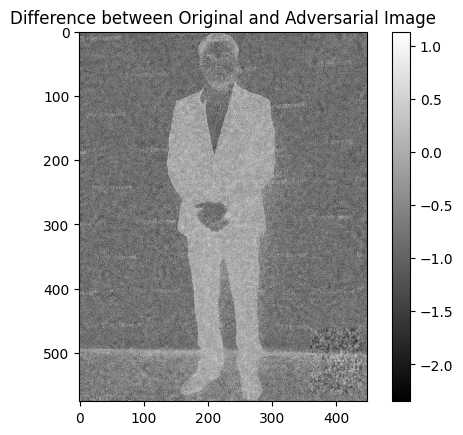

In [ ]:
image_original = preprocess(Image.open("sad_ldc_output.jpg")).unsqueeze(0).to(device)
image_adversarial = preprocess(Image.open("sad_ldc_output_noise.jpg")).unsqueeze(0).to(device)

# Convert tensors back to PIL images for visualization
adversarial_diff = (image_adversarial - image_original).squeeze().detach().cpu().numpy()

plt.imshow(adversarial_diff[0], cmap='gray')
plt.title("Difference between Original and Adversarial Image")
plt.colorbar()
plt.show()

Similar to the t-shirt prompt, the output image above shows the modifications were subtle in terms of perceptual similarity (can still be interepreted by human).

<div class="alert alert-block alert-success">
    
## **5. Targetting Light.TTI's AI image detection approaches (Bonus for Milestone 2)**  <a class="anchor" name="5"></a>

Note: *We've reached out and gotten permission from the original team to utlise their codes for this AI image detection testing.*

In Group Light.TTI's approach, they've implemented a combination of two AI image detection appraoches.
- PatchCraft Model
- DeepImageFingeprint Model

For this testing, we will use their combined collab version which combine both models to create an ensemble AI image detection and test it among our orginal ouputted images from InstructPix2Pix vs our Adversarial Noised attack images to see if we can bypass their detection system to show as a real image.

The notebook which we tested their codes can be found here: [Dark.DONFAILUS target on Light.TTI's AI Image Detection ](https://colab.research.google.com/drive/1qjNmUGq2PvjyF8j-RZ1A4MkHLbWwakSt?usp=sharing)

For the purpose of convinnence, I'll attach the output of the code we ran using their AI Image detection then give a brief analysis on the results we obtained here.

> ### Test on dog.jpg

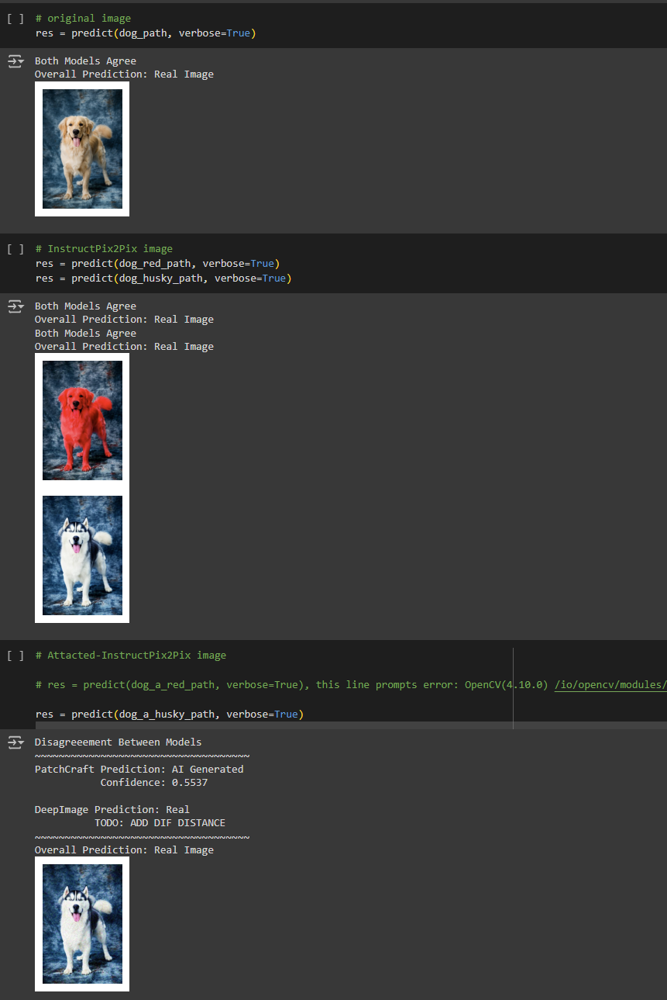

> ### Test on human.jpg


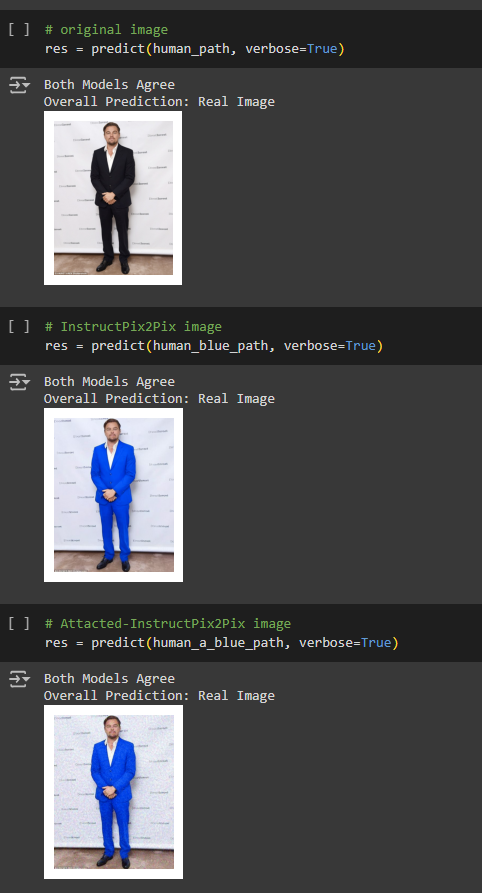

> ### Test on sculpture.jpg

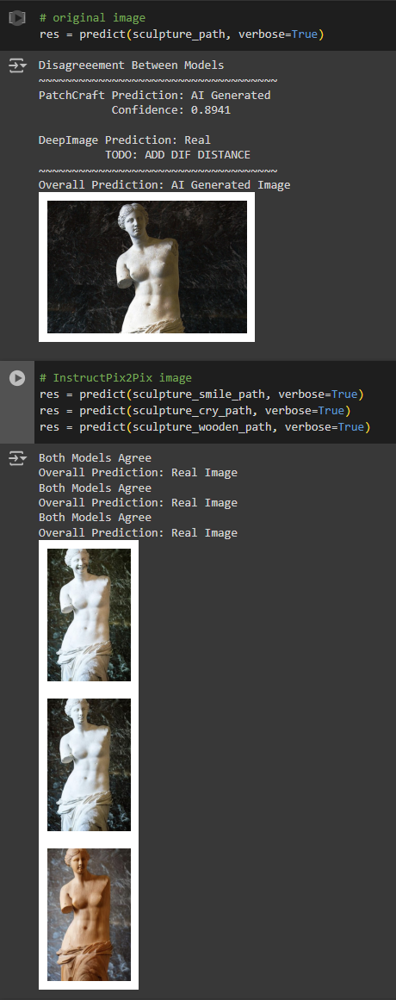

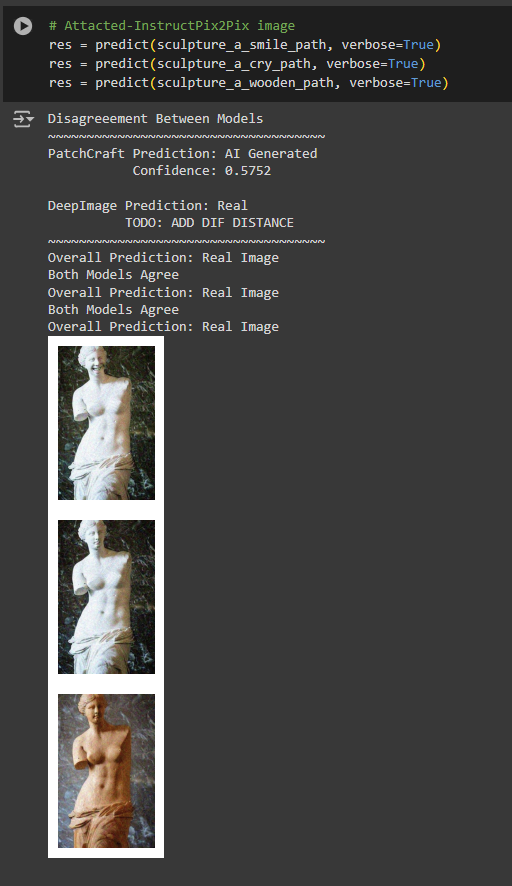

### Analysis on Output

We used 3 sets of images, dog images, human images and sculpture images. Each group consists of original image, IntructPix2Pix manipulated version and Attacked IntructPix2Pix manipulated version. Classification for each set of images were mostly identical (“Real”), even for IntructPix2Pix manipulated version and Attacked IntructPix2Pix manipulated version. Except for one variant of dog image set (namely, attacked-version husky image).
<br>
<br>
Looking above at our sample tests, from our observation we can conclude that
according to our testing results and combining Light.TTI’s Collab, our adversarial attack mechanism does bypass the counter side guarding system however, their system seems to be more efficient on the AI generated images compared to AI manipulated images.

<div class="alert alert-block alert-success">
    
## **6. Overall analysis on Results**  <a class="anchor" name="6"></a>

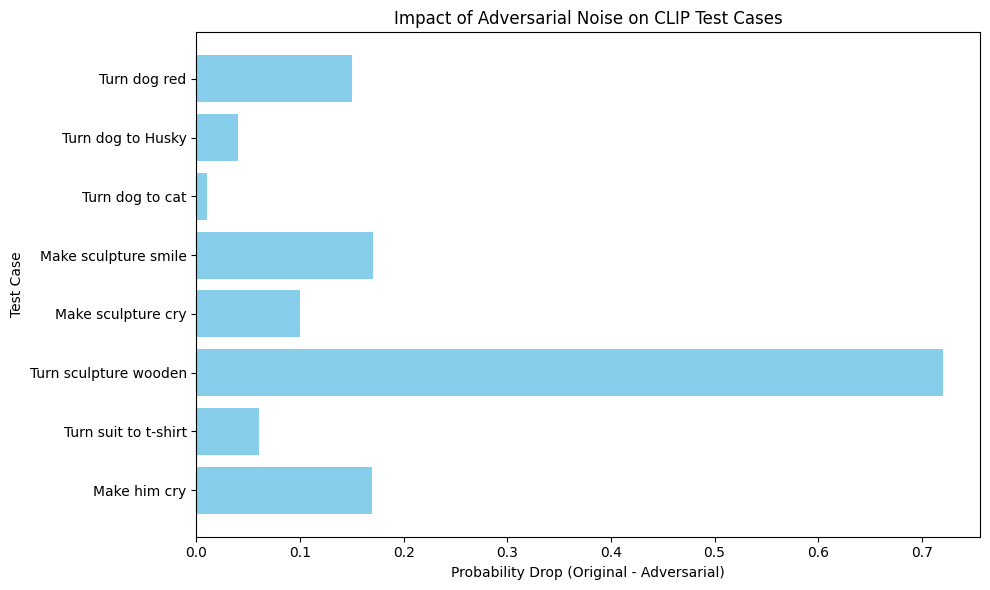

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

tests = [
    "Turn dog red", "Turn dog to Husky", "Turn dog to cat",
    "Make sculpture smile", "Make sculpture cry",
    "Turn sculpture wooden", "Turn suit to t-shirt", "Make him cry"
]

# Probability differences for the correct class (original - adversarial)
# These values represent the drop in probability due to adversarial noise
prob_differences = [
    0.1499,  # Turn dog red (Red class)
    0.0400,  # Turn dog to Husky (Husky class)
    0.0102,  # Turn dog to cat (Cat class)
    0.1702,  # Make sculpture smile (Happy class)
    0.1001,  # Make sculpture cry (Sad class)
    0.7202,  # Turn sculpture wooden (Wooden class)
    0.0600,  # Turn suit to t-shirt (T-shirt class)
    0.1699   # Make him cry (Sad class)
]

# Create the bar chart
plt.figure(figsize=(10, 6))
plt.barh(tests, prob_differences, color='skyblue')
plt.xlabel("Probability Drop (Original - Adversarial)")
plt.ylabel("Test Case")
plt.title("Impact of Adversarial Noise on CLIP Test Cases")
plt.gca().invert_yaxis()  # Invert y-axis to have the highest impact at the top
plt.tight_layout()

# Show the plot
plt.show()

*The probability differences was hardcoded to make explanation of result easier. Also the result on CLIP test cases was based on our generated images, test results may differ if attempted on different devices.*

In summary, adversarial attacks were most effective on **sculpture images**, as models rely heavily on texture and geometric patterns for classification. Small perturbations disrupted these patterns easily, leading to frequent misclassification, especially in non-CLIP models. **Dog images** also performed well in fooling models like ResNet50 and VGG16, which focus on texture, but CLIP remained more resilient due to its multimodal training. **Human images** were the most resistant to attacks, as models are extensively trained on human-centric datasets, making them better at handling subtle adversarial noise.

Perceptual metrics (SSIM and LPIPS) showed that **sculpture images** had more perceptible changes, while **dog** and **human images** maintained better perceptual similarity. Overall, human-related models were more robust, while sculptures were more vulnerable due to their rigid, easily disturbed structures.

Lastly, it can be seen from the plot which shows the adversarial perturbations that for all prompts, the overall structure and silhouette still remains intact, which suggests that while the noise affected the image, the modifications were subtle in terms of **perceptual similarity** (can still be interepreted by human).

<div class="alert alert-block alert-success">
    
## **7. References**  <a class="anchor" name="7"></a>

1. Brooks, T., Holynski, A., & Efros, A. A. (2023). InstructPix2Pix: Learning to Follow Image Editing Instructions. arXiv preprint arXiv:2211.09800. https://doi.org/10.48550/arXiv.2211.09800
2. Moosavi-Dezfooli, S. M., Fawzi, A., & Frossard, P. (2016). DeepFool: A simple and accurate method to fool deep neural networks. Proceedings of the IEEE Conference on Computer Vision and Pattern Recognition (CVPR), 2574-2582. https://doi.org/10.1109/CVPR.2016.282
